In [1]:
pwd

'/home/j.maragall'

/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinsta

UMAP Parameters:
n_neighbors: 150
min_dist: 0
n_components: 2
metric: canberra


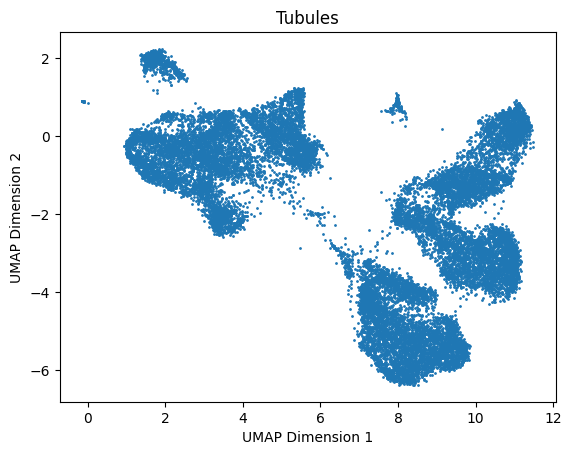

In [92]:
import pandas as pd

features_df = pd.read_csv("/home/j.maragall/PRESENTATION_FEATURES.csv")

import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Impute all NaN values with 0
features_df.fillna(0, inplace=True)

# Create a scaler object
scaler = MinMaxScaler()

# Fit and transform the data
features_df = pd.DataFrame(scaler.fit_transform(features_df), columns=features_df.columns)


# Perform dimensionality reduction using UMAP
umap_model = UMAP(n_neighbors=150, min_dist=0, n_components=2, metric="canberra")
embedding = umap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Tubules')

# Print the parameters
print("UMAP Parameters:")
print(f"n_neighbors: {umap_model.n_neighbors}")
print(f"min_dist: {umap_model.min_dist}")
print(f"n_components: {umap_model.n_components}")
print(f"metric: {umap_model.metric}")

plt.show()



In [100]:
import numpy as np
from sklearn.neighbors import kneighbors_graph
import community as community_louvain
import networkx as nx

# Assuming 'deep_embedding' is your data matrix from the UMAP reduction

# Step 1: Create a k-NN graph
# Choose k, the number of nearest neighbors. The choice of k depends on your dataset. sqrt(n) is my k choice.
k = 134
knn_graph = kneighbors_graph(embedding, k, include_self=False, mode='distance')

# Convert the k-NN graph to a NetworkX graph for Louvain
G = nx.from_scipy_sparse_matrix(knn_graph)

# Step 2: Apply Louvain clustering
# The function returns a dictionary where keys are node indices and values are the partition numbers (cluster labels)
partition = community_louvain.best_partition(G)

# Convert partition dictionary to a list of labels
labels_louvain = np.array(list(partition.values()))

# Now you have 'deep_labels_louvain' as your cluster labels, you can proceed with your analysis

import matplotlib.pyplot as plt

# Assuming 'deep_embedding' is your data reduced to 2 dimensions with UMAP
# and 'deep_labels_louvain' are the labels obtained from Louvain clustering

plt.figure(figsize=(10, 8))
scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=labels_louvain, cmap='viridis', alpha=0.6)

# Creating a legend
# We'll create a custom legend to show the cluster numbers
# First, find the number of unique clusters
unique_labels = np.unique(deep_labels_louvain)
# Then, create a list of legend entries
legend1 = plt.legend(handles=scatter.legend_elements()[0], 
                     labels=['Cluster {}'.format(i) for i in unique_labels],
                     title="Clusters")

plt.title('Louvain Clustering of UMAP Embeddings')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()



AttributeError: module 'networkx' has no attribute 'from_scipy_sparse_matrix'

In [91]:
features_df.shape

(22280, 626)

In [79]:
features_df = features_df[features_df['glomerulus'] != 0]

In [80]:
features_df.drop(columns=['shape_label', 'glomerulus'], axis=-1)

,channel_0_mean,channel_0_std,channel_0_variance,channel_0_entropy,channel_1_mean,channel_1_std,channel_1_variance,channel_1_entropy,channel_2_mean,channel_2_std,...,channel_43_max_intensity,channel_43_min_intensity,channel_43_sum_intensity,centroid_x,centroid_y,orientation,minr,minc,maxr,maxc
391,219.700000,44.420547,1973.185000,3.755335,0.0,0.0,0.0,0.0,1.456250,0.805038,...,2.0,0.0,67.0,1603.8562,3126.0063,-0.919931,1597.0,3119.0,1614.0,3136.0
392,183.723680,41.275265,1703.647300,3.893218,0.0,0.0,0.0,0.0,1.842105,0.770383,...,2.0,0.0,38.0,1603.7500,3209.9670,1.446086,1598.0,3195.0,1612.0,3217.0
394,214.157410,32.111540,1031.151100,3.295862,0.0,0.0,0.0,0.0,1.509259,0.687122,...,2.0,0.0,37.0,1605.0555,3082.4630,0.300944,1599.0,3076.0,1614.0,3087.0
403,195.771240,51.446083,2646.699200,3.811272,0.0,0.0,0.0,0.0,2.098039,6.198002,...,2.0,0.0,56.0,1624.1635,3117.9478,-0.216935,1616.0,3111.0,1631.0,3124.0
405,228.864070,7.406437,54.855312,3.091500,0.0,0.0,0.0,0.0,2.121359,1.028634,...,3.0,0.0,99.0,1626.1456,3058.5679,0.609976,1617.0,3047.0,1637.0,3066.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6832,70.172660,18.356160,336.948600,3.864123,0.0,0.0,0.0,0.0,10.417266,4.484826,...,10.0,0.0,400.0,15742.5540,3574.4390,-1.473547,15736.0,3567.0,15748.0,3584.0
6833,82.274510,18.827470,354.473660,3.924632,0.0,0.0,0.0,0.0,1.186274,0.479591,...,2.0,0.0,29.0,15742.4710,3749.3628,-0.792845,15735.0,3743.0,15748.0,3756.0
6834,160.894730,47.270325,2234.483600,4.526279,0.0,0.0,0.0,0.0,1.705263,0.779658,...,3.0,0.0,83.0,15750.2690,3512.4473,1.445345,15744.0,3505.0,15759.0,3521.0
6835,69.620255,13.066823,170.741870,3.751347,0.0,0.0,0.0,0.0,1.042194,0.628366,...,2.0,0.0,69.0,15753.6920,3663.4600,-1.501799,15746.0,3654.0,15762.0,3674.0


In [81]:
features_df.shape

(1838, 628)

In [4]:
!pip install joblib

Defaulting to user installation because normal site-packages is not writeable


In [82]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler


# Impute all NaN values with 0
features_df.fillna(0, inplace=True)

# Create a scaler object
scaler = MinMaxScaler()

# Fit and transform the data
features_df = pd.DataFrame(scaler.fit_transform(features_df), columns=features_df.columns)


/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinsta

In [4]:
!pip uninstall matplotlib -y
!pip install matplotlib==3.3.2


Found existing installation: matplotlib 3.3.2
^C
ERROR: Operation cancelled by user
^C
Traceback (most recent call last):
  File "/apps/jupyter/6.5.4/bin/pip", line 5, in <module>
    from pip._internal.cli.main import main
  File "/apps/jupyter/6.5.4/lib/python3.10/site-packages/pip/_internal/cli/main.py", line 10, in <module>
    from pip._internal.cli.autocompletion import autocomplete
  File "/apps/jupyter/6.5.4/lib/python3.10/site-packages/pip/_internal/cli/autocompletion.py", line 10, in <module>
    from pip._internal.cli.main_parser import create_main_parser
  File "/apps/jupyter/6.5.4/lib/python3.10/site-packages/pip/_internal/cli/main_parser.py", line 9, in <module>
    from pip._internal.build_env import get_runnable_pip
  File "/apps/jupyter/6.5.4/lib/python3.10/site-packages/pip/_internal/build_env.py", line 15, in <module>
    from pip._vendor.packaging.requirements import Requirement
  File "/apps/jupyter/6.5.4/lib/python3.10/site-packages/pip/_vendor/packaging/requireme

In [83]:
import tiffslide as openslide
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imsave
import cv2
import imageio
from tifffile import imread

from skimage.measure import regionprops, label
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from joblib import Parallel, delayed
import pandas as pd
from umap import UMAP

In [22]:
features_df.shape

(6907, 626)

/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
Exception ignored on calling ctypes callback function: <function ExecutionEngine._raw_object_cache_notify at 0x153dd075f520>
Traceback (most recent call last):
  File "/home/j.mara

UMAP Parameters:
n_neighbors: 70
min_dist: 0
n_components: 2
metric: minkowski


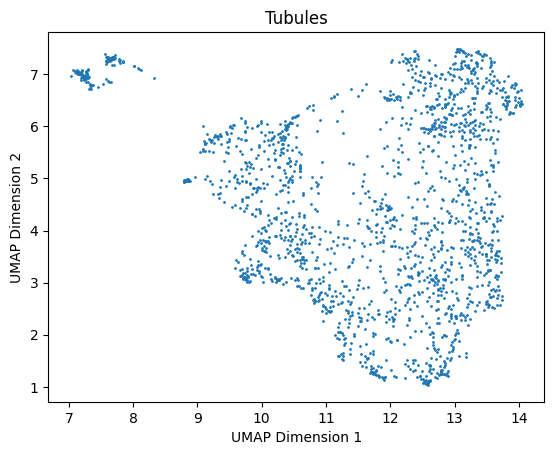

In [84]:
# Perform dimensionality reduction using UMAP
umap_model = UMAP(n_neighbors=70, min_dist=0, n_components=2, metric="minkowski")
embedding = umap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Tubules')

# Print the parameters
print("UMAP Parameters:")
print(f"n_neighbors: {umap_model.n_neighbors}")
print(f"min_dist: {umap_model.min_dist}")
print(f"n_components: {umap_model.n_components}")
print(f"metric: {umap_model.metric}")

plt.show()

/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


UMAP Parameters:
n_neighbors: 70
min_dist: 0
n_components: 2
metric: chebyshev


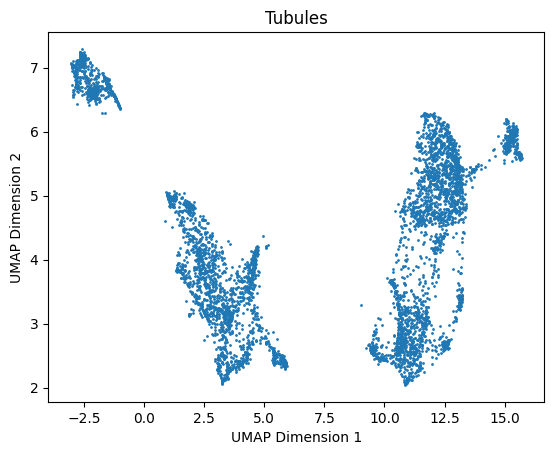

In [72]:
# Perform dimensionality reduction using UMAP
umap_model = UMAP(n_neighbors=70, min_dist=0, n_components=2, metric="chebyshev")
embedding = umap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Tubules')
# Print the parameters
print("UMAP Parameters:")
print(f"n_neighbors: {umap_model.n_neighbors}")
print(f"min_dist: {umap_model.min_dist}")
print(f"n_components: {umap_model.n_components}")
print(f"metric: {umap_model.metric}")

plt.show()

/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


UMAP Parameters:
n_neighbors: 70
min_dist: 0
n_components: 2
metric: cosine


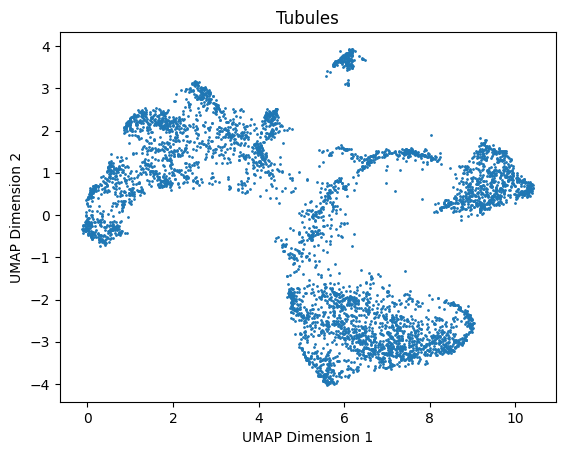

In [73]:
# Perform dimensionality reduction using UMAP
umap_model = UMAP(n_neighbors=70, min_dist=0, n_components=2, metric="cosine")
embedding = umap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Tubules')

# Print the parameters
print("UMAP Parameters:")
print(f"n_neighbors: {umap_model.n_neighbors}")
print(f"min_dist: {umap_model.min_dist}")
print(f"n_components: {umap_model.n_components}")
print(f"metric: {umap_model.metric}")

plt.show()

/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


UMAP Parameters:
n_neighbors: 70
min_dist: 0
n_components: 2
metric: euclidean


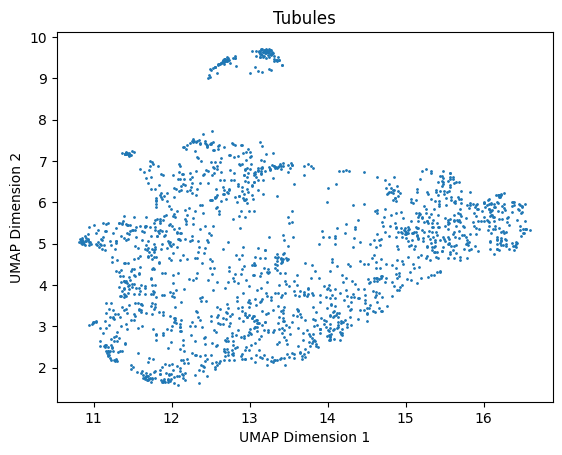

In [85]:
# Perform dimensionality reduction using UMAP
umap_model = UMAP(n_neighbors=70, min_dist=0, n_components=2, metric="euclidean")
embedding = umap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Tubules')

# Print the parameters
print("UMAP Parameters:")
print(f"n_neighbors: {umap_model.n_neighbors}")
print(f"min_dist: {umap_model.min_dist}")
print(f"n_components: {umap_model.n_components}")
print(f"metric: {umap_model.metric}")

plt.show()#

/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


UMAP Parameters:
n_neighbors: 70
min_dist: 0
n_components: 2
metric: manhattan


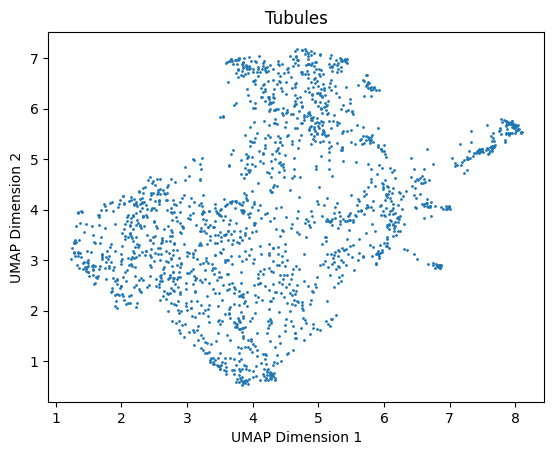

In [86]:
# Perform dimensionality reduction using UMAP
umap_model = UMAP(n_neighbors=70, min_dist=0, n_components=2, metric="manhattan")
embedding = umap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Tubules')
# Print the parameters
print("UMAP Parameters:")
print(f"n_neighbors: {umap_model.n_neighbors}")
print(f"min_dist: {umap_model.min_dist}")
print(f"n_components: {umap_model.n_components}")
print(f"metric: {umap_model.metric}")

plt.show()#

/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/home/j.maragall/.local/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


UMAP Parameters:
n_neighbors: 70
min_dist: 0
n_components: 2
metric: canberra


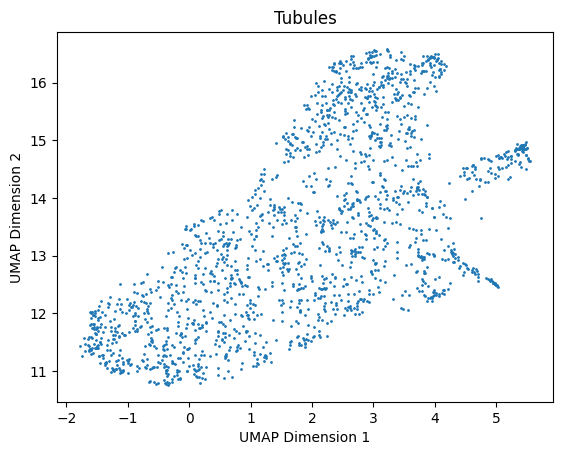

In [87]:
# Perform dimensionality reduction using UMAP
umap_model = UMAP(n_neighbors=70, min_dist=0, n_components=2, metric="canberra")
embedding = umap_model.fit_transform(features_df)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1], s=1)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.title('Tubules')

# Print the parameters
print("UMAP Parameters:")
print(f"n_neighbors: {umap_model.n_neighbors}")
print(f"min_dist: {umap_model.min_dist}")
print(f"n_components: {umap_model.n_components}")
print(f"metric: {umap_model.metric}")

plt.show()#

Plot saved to ./UMAP_Hierarchical_Clustering.png


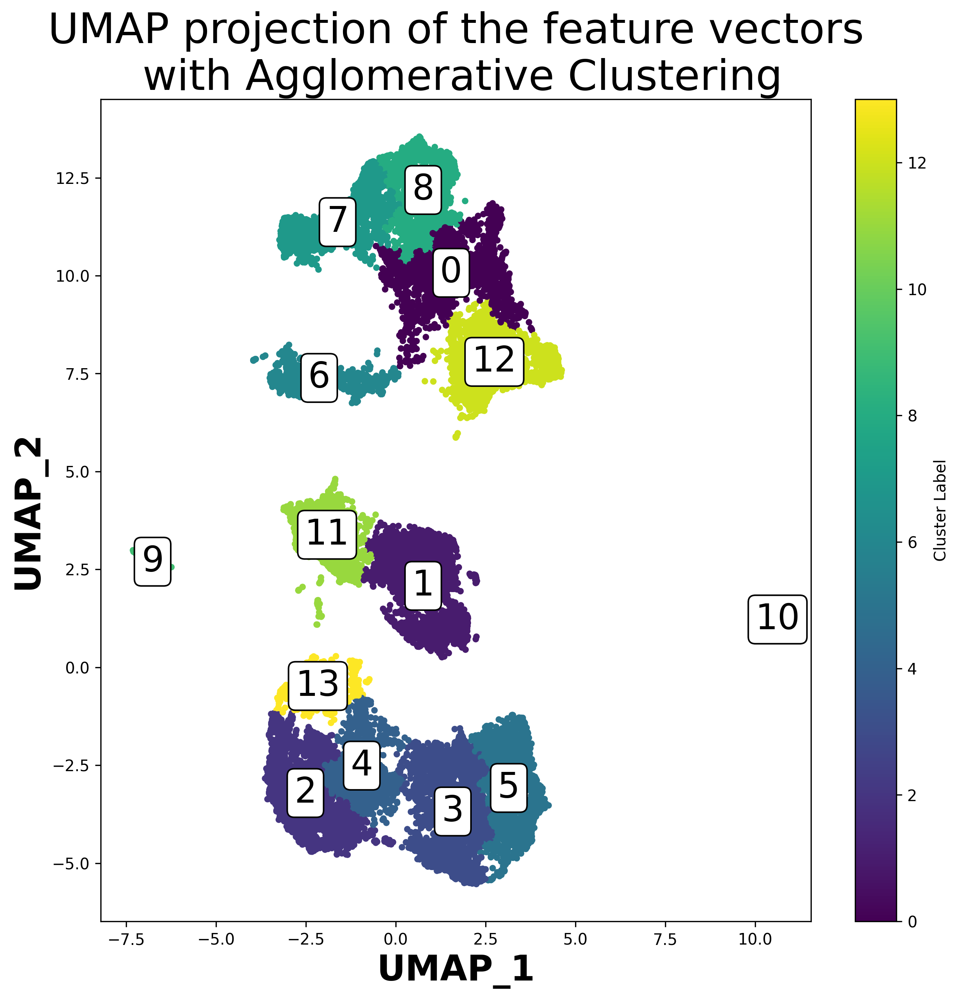

In [21]:
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'embedding' is your UMAP embeddings array
# Apply the AgglomerativeClustering algorithm to the UMAP embeddings
agg_clustering = AgglomerativeClustering(n_clusters=14)  # adjust the number of clusters as needed
labels = agg_clustering.fit_predict(embedding)

# Calculate cluster centroids
centroids = np.array([embedding[labels == i].mean(axis=0) for i in range(14)])

# Plot the results with different colors for each cluster
plt.figure(figsize=(9, 9), dpi=300)  # Adjust figure size and DPI for high resolution
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='viridis', s=10)  # Adjusted marker size for visibility

# Annotate the clusters
for i, centroid in enumerate(centroids):
    plt.text(centroid[0], centroid[1], str(i), fontsize=22.5,  # Adjusted for visual balance
             ha='center', va='center',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

plt.xlabel('UMAP_1', fontsize=22.5, fontweight="bold")
plt.ylabel('UMAP_2', fontsize=22.5, fontweight="bold")
plt.title('UMAP projection of the feature vectors\n with Agglomerative Clustering', fontsize=27)
plt.colorbar(label='Cluster Label')
plt.tight_layout()

# Save the plot in PNG format with high DPI
save_path = "./UMAP_Hierarchical_Clustering.png"
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
print(f"Plot saved to {save_path}")

plt.show()


In [2]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Silhouette Score
silhouette_avg = silhouette_score(embedding, labels)
print(f"Silhouette Score: {silhouette_avg}")

# Davies-Bouldin Index
davies_bouldin_idx = davies_bouldin_score(embedding, labels)
print(f"Davies-Bouldin Index: {davies_bouldin_idx}")

# Calinski-Harabasz Index
calinski_harabasz_idx = calinski_harabasz_score(embedding, labels)
print(f"Calinski-Harabasz Index: {calinski_harabasz_idx}")


NameError: name 'embedding' is not defined

Silhouette Score measures how similar an object is to its own cluster compared to other clusters. The value ranges from -1 (incorrect clustering) to +1 (highly dense clustering), where high values indicate that the object is well matched to its own cluster and poorly matched to neighboring clusters.

Davies-Bouldin Index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. Lower Davies-Bouldin values indicate better clustering.

Calinski-Harabasz Index is the ratio of the sum of between-clusters dispersion and of intra-cluster dispersion for all clusters, where higher values indicate better clustering separation.
***

In [9]:
# Add cluster_labels column to the DataFrame
features_df['cluster_labels'] = labels

In [11]:
! pip install seaborn

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 6.4 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 80.1 MB/s eta 0:00:00:00:010:01
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.3.2
    Uninstalling matplotlib-3.3.2:
      Successfully uninstalled matplotlib-3.3.2
  You can safely remove it manually.


/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


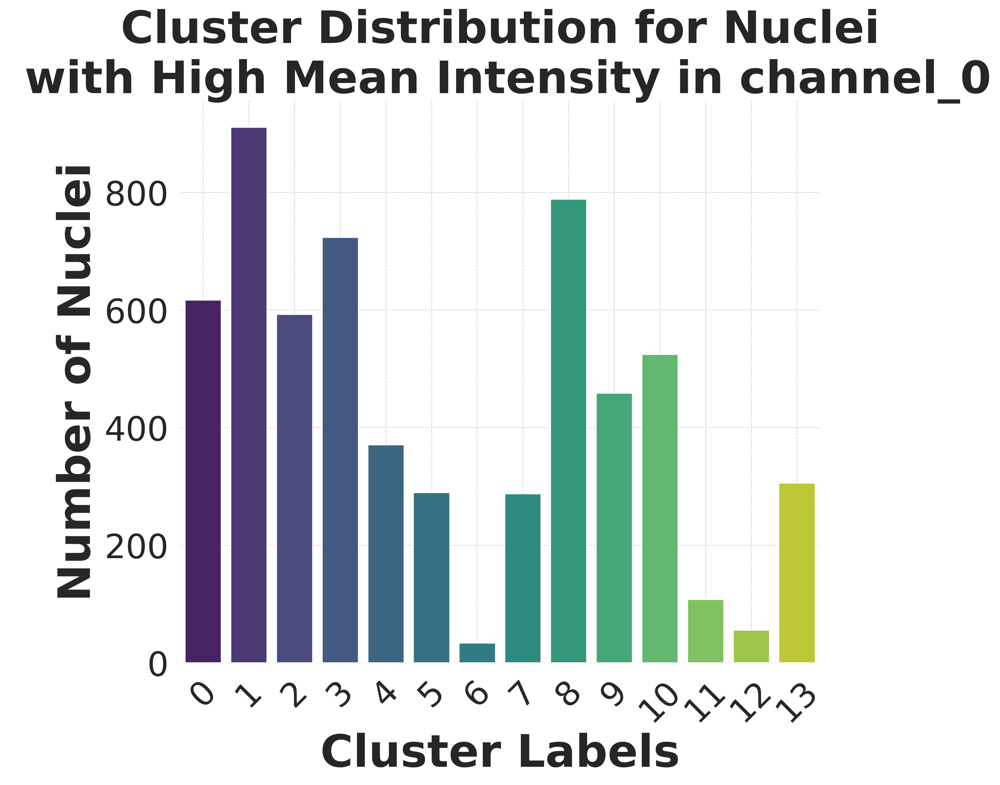

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


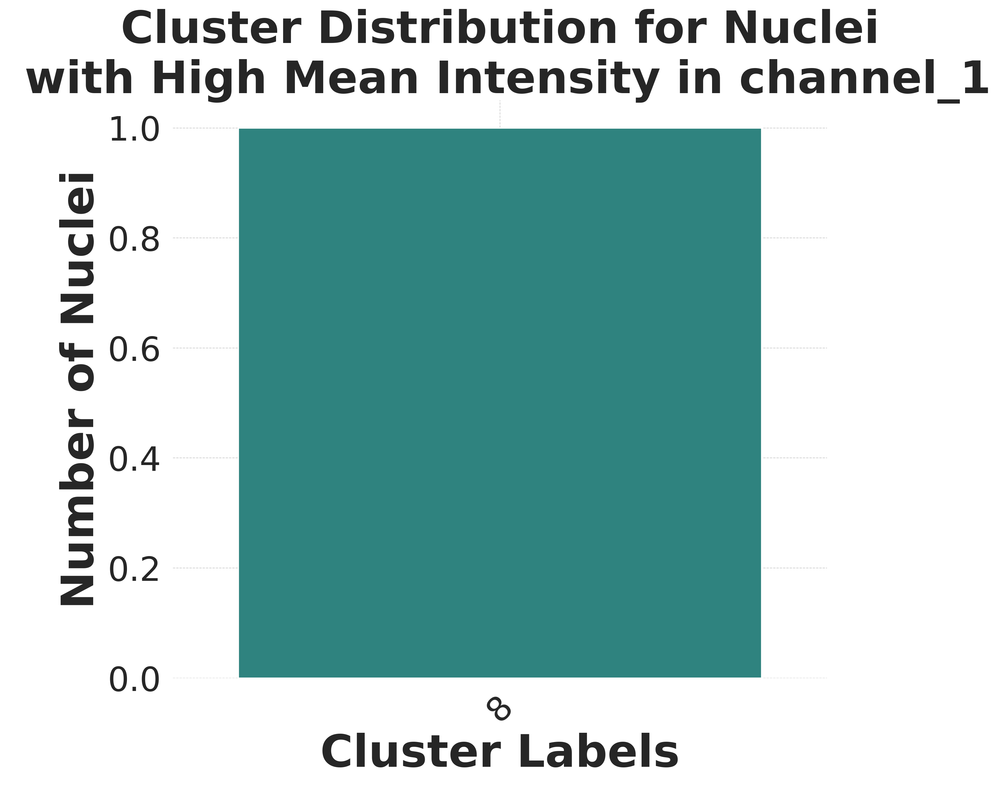

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


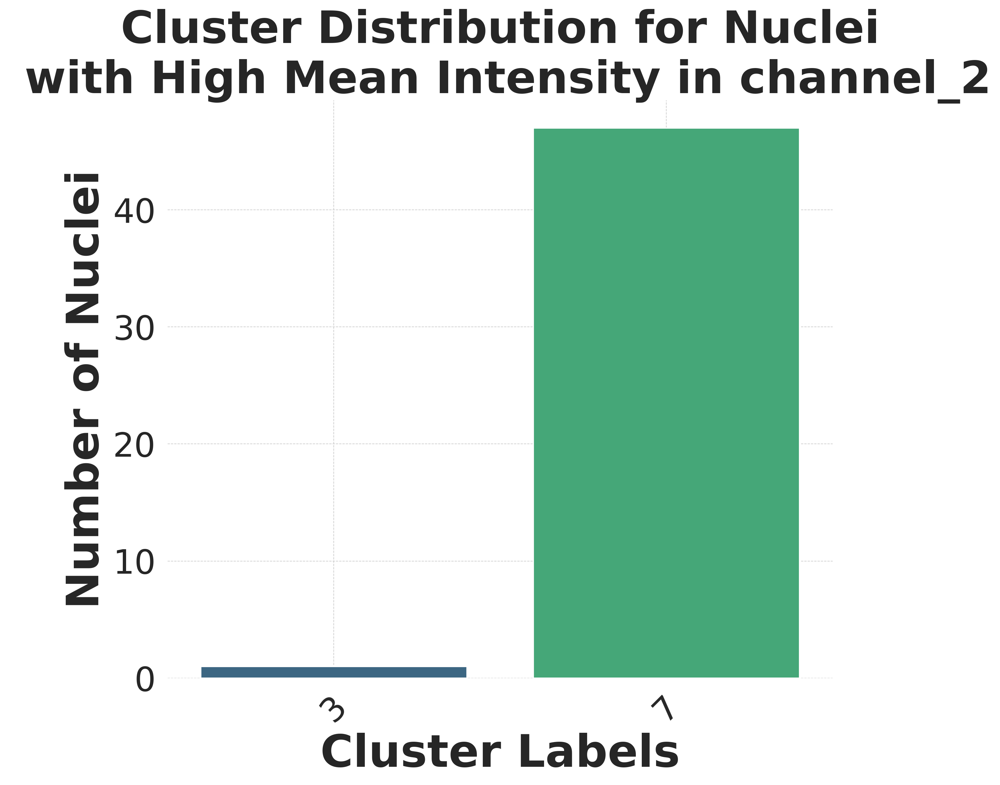

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


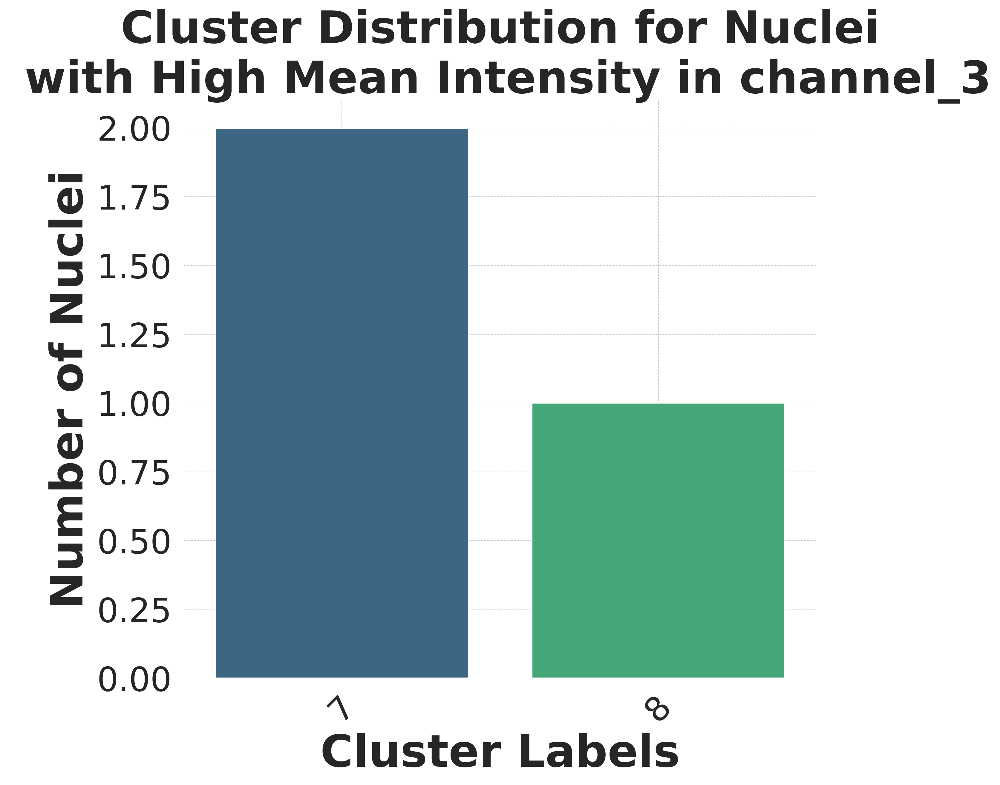

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


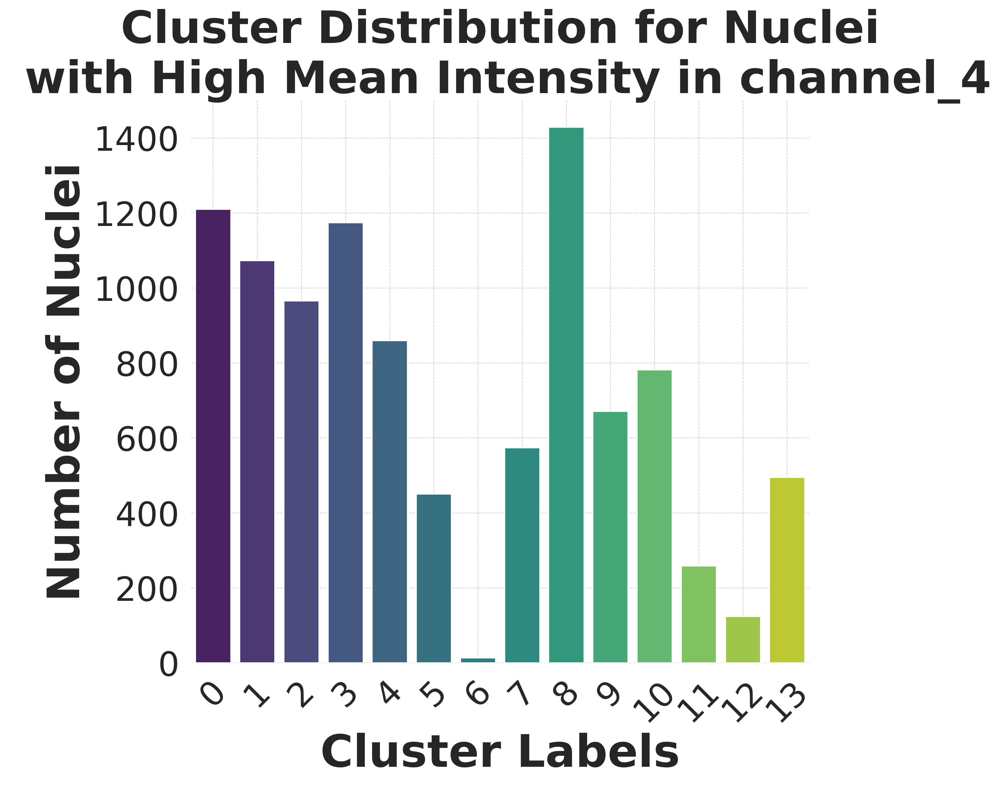

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


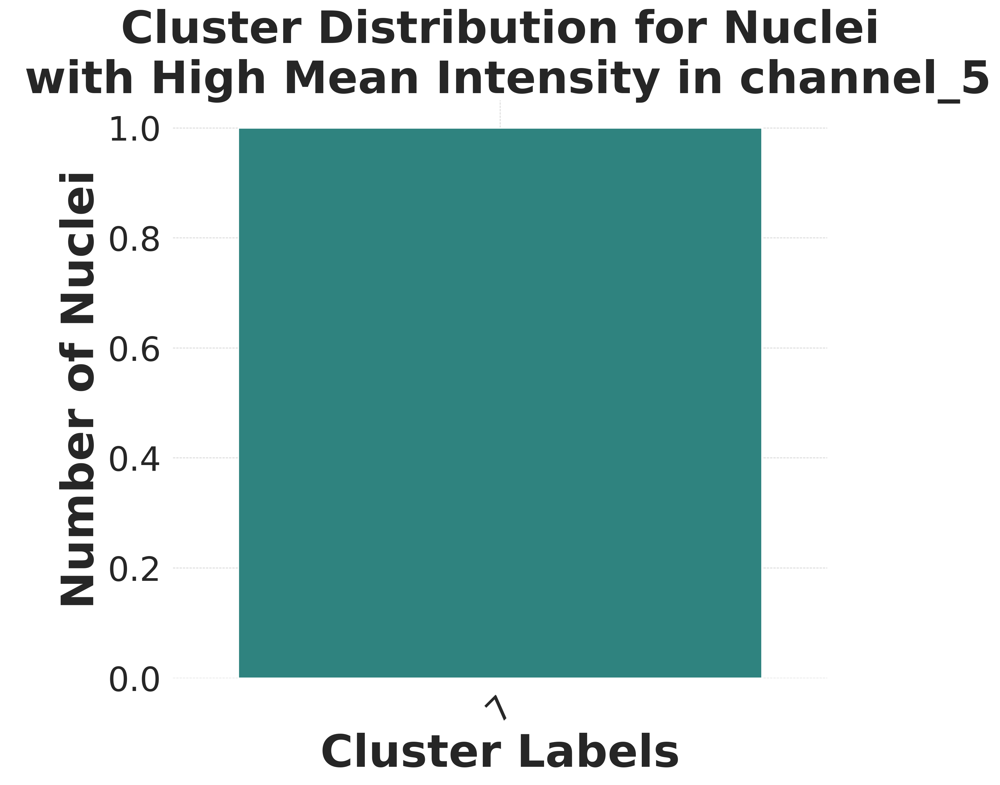

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


Saved plot for channel_6_mean to ./channel_6_mean_distribution_plot.png


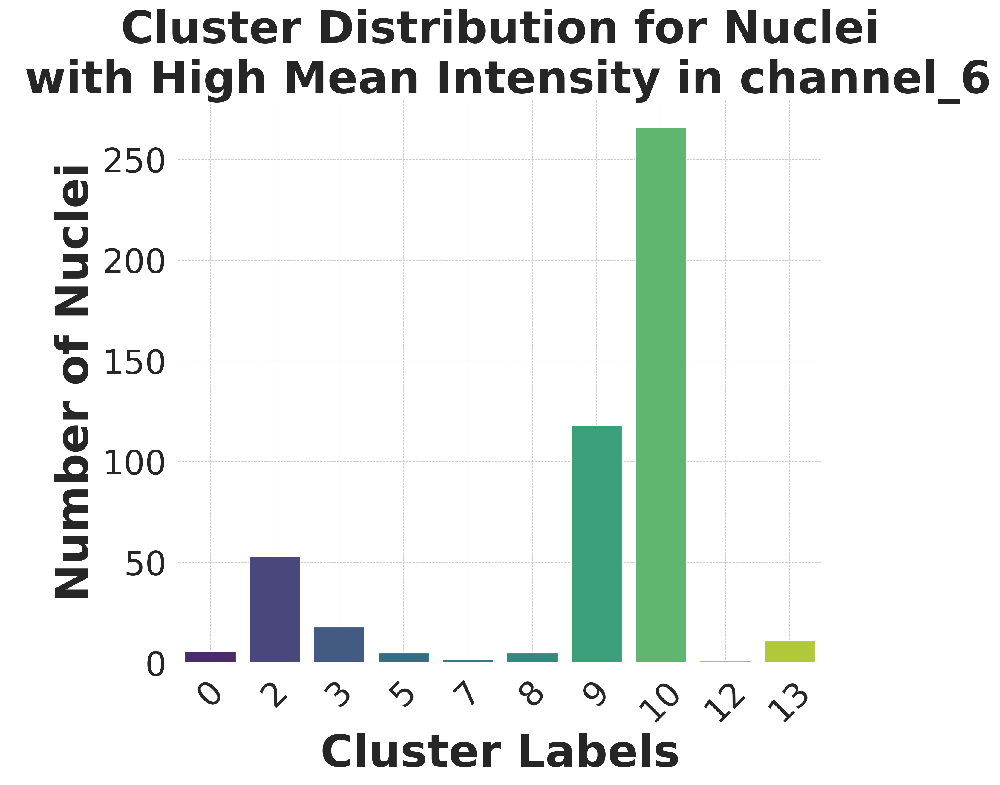

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


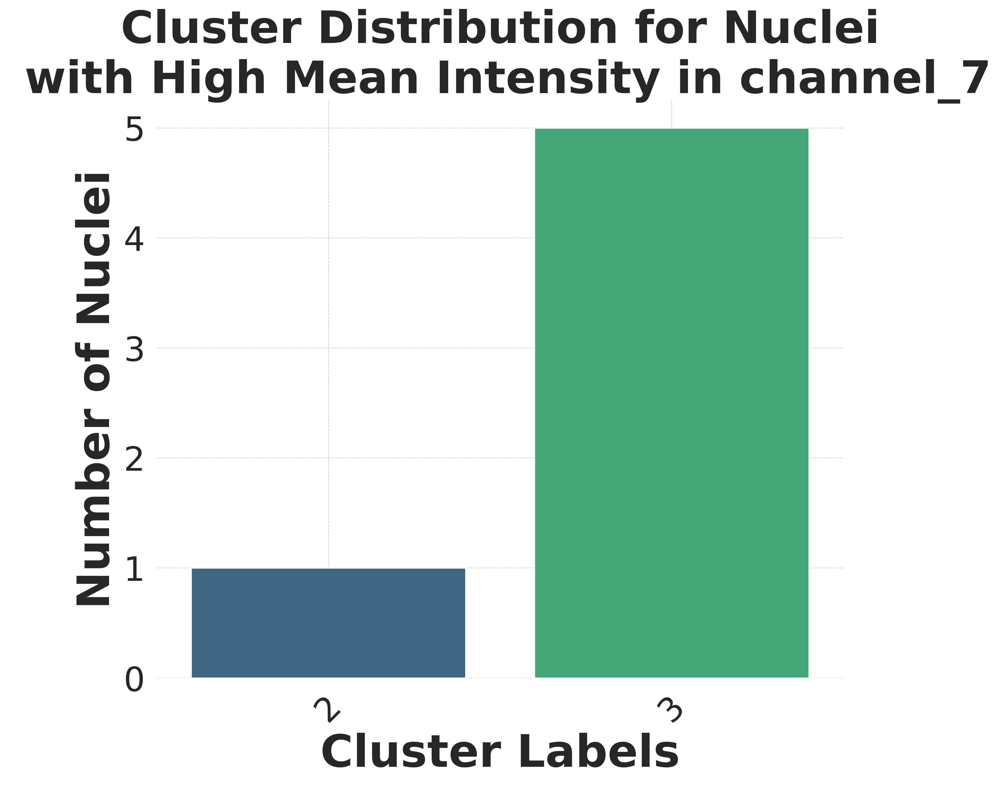

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


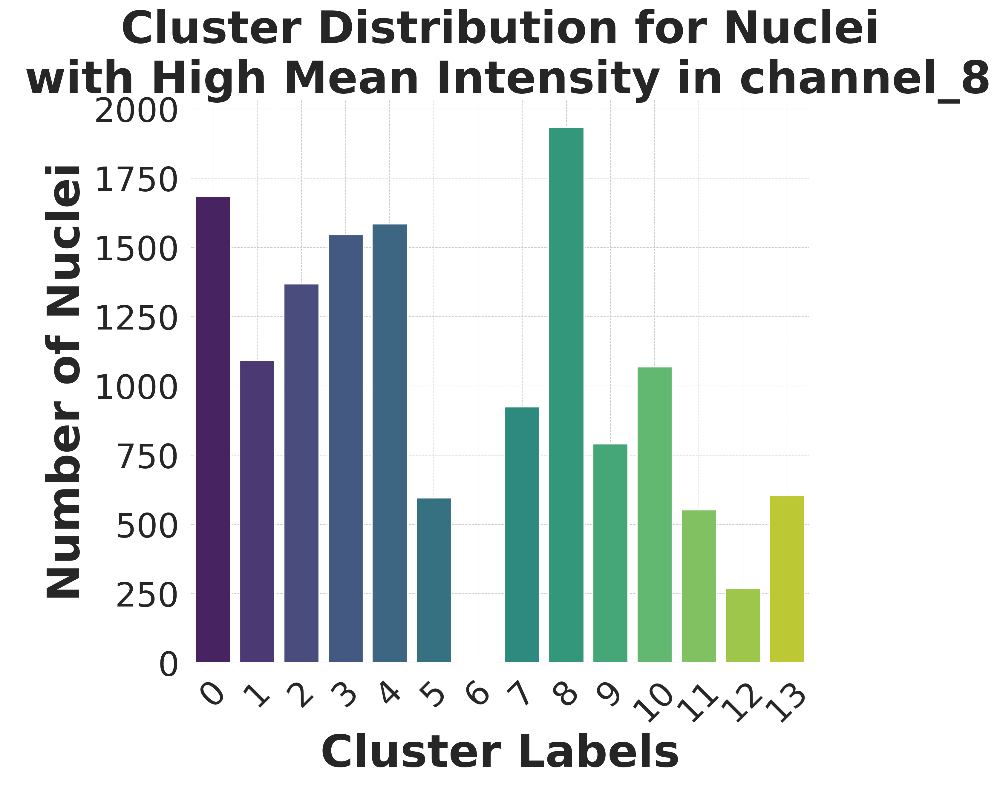

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


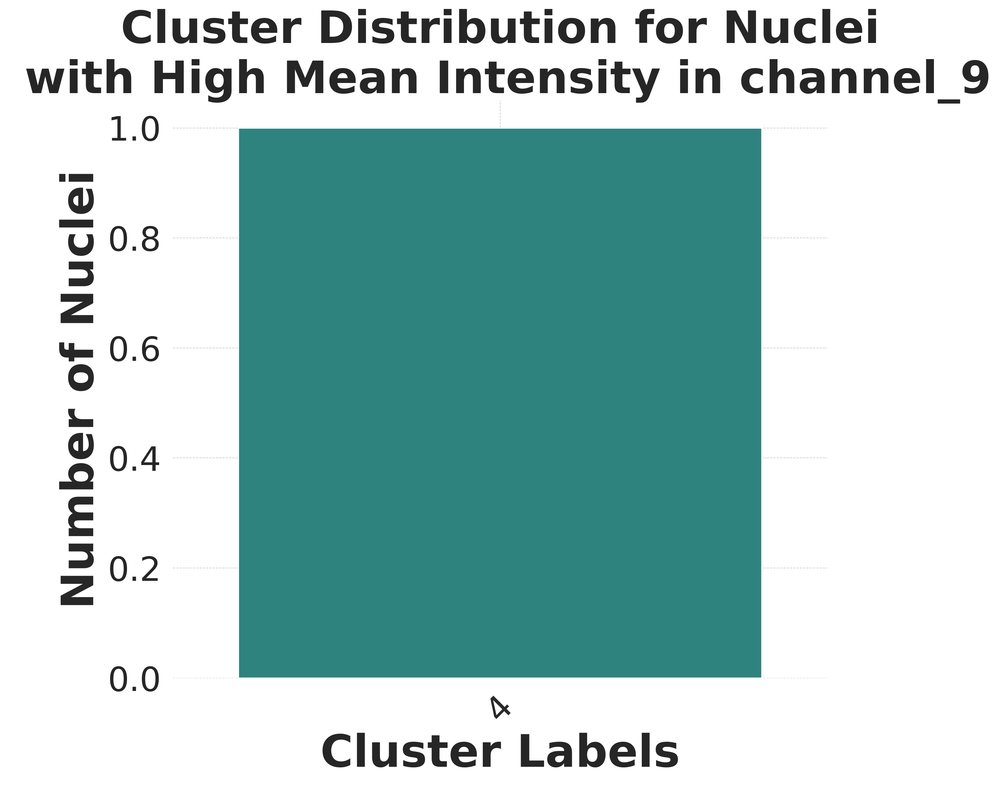

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


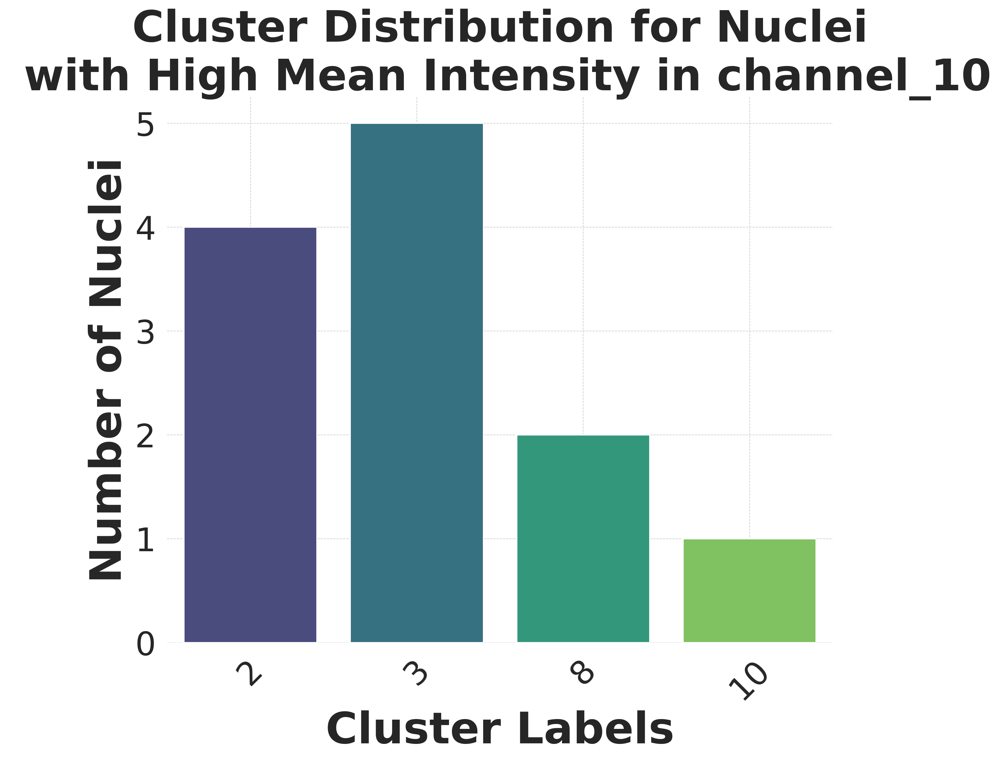

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


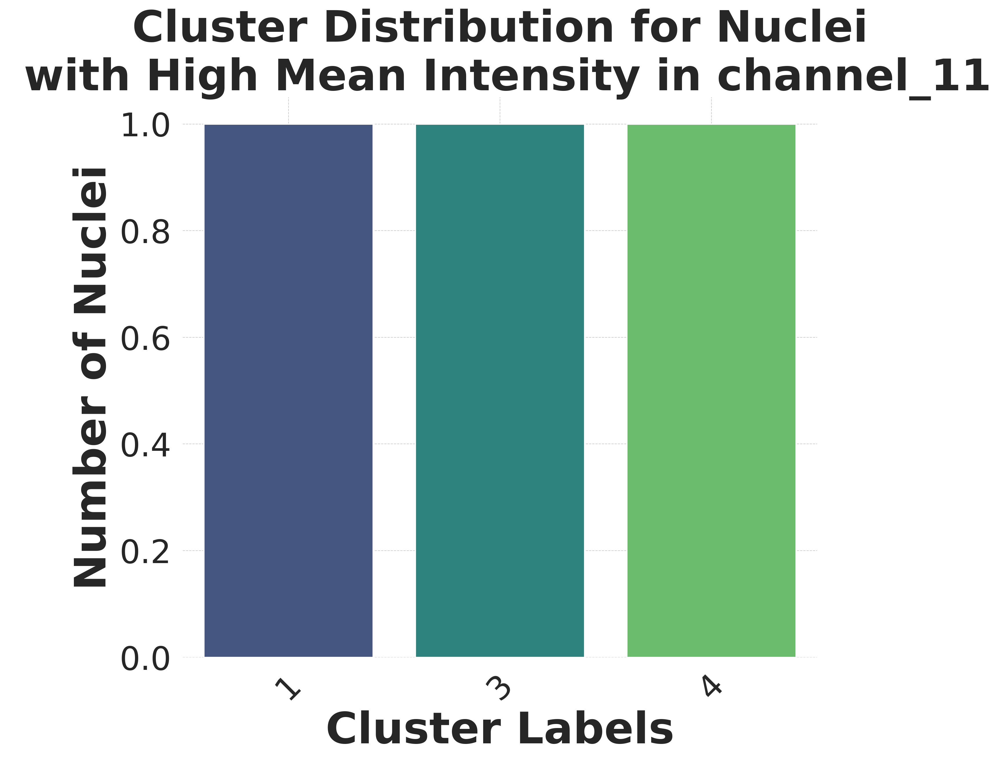

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


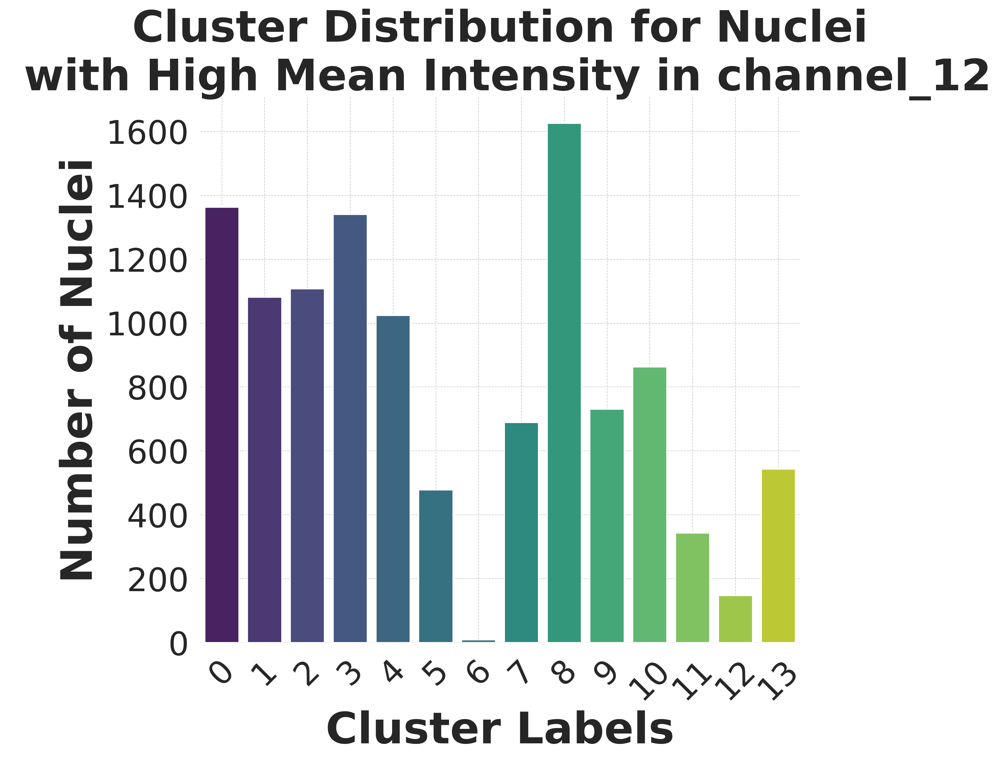

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


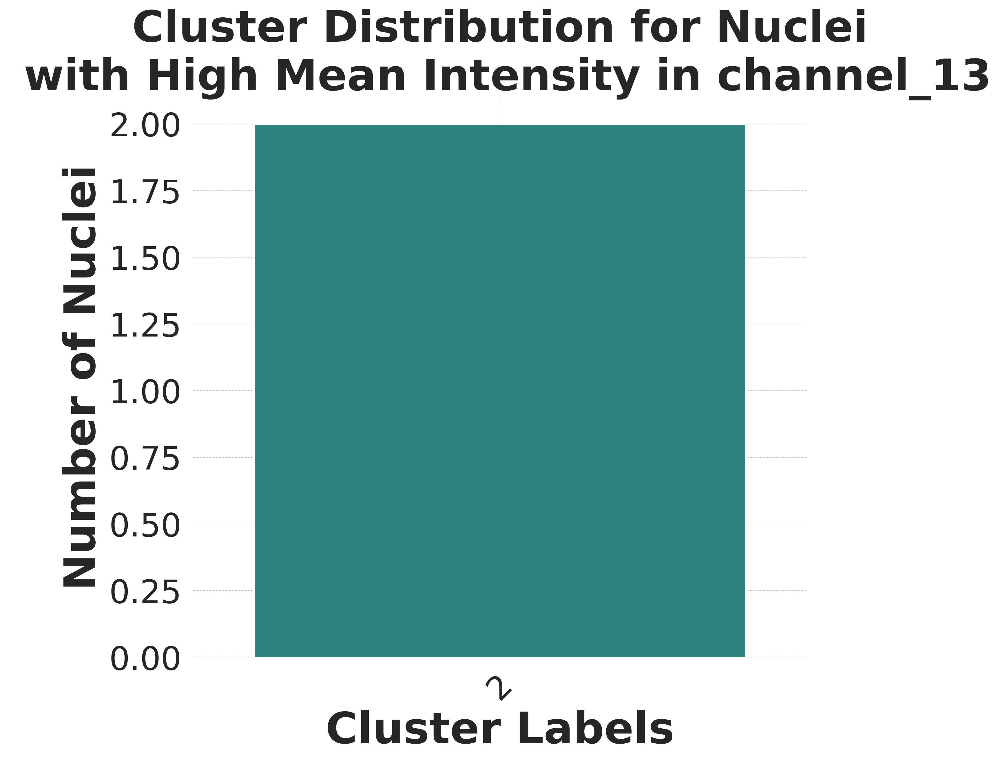

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


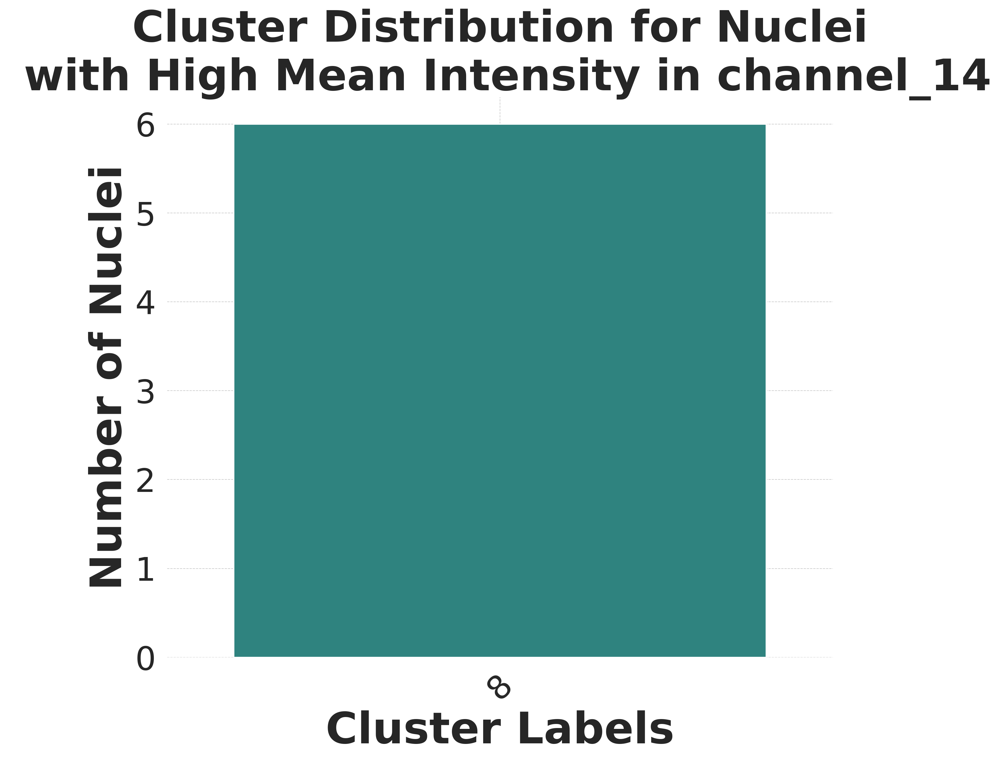

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


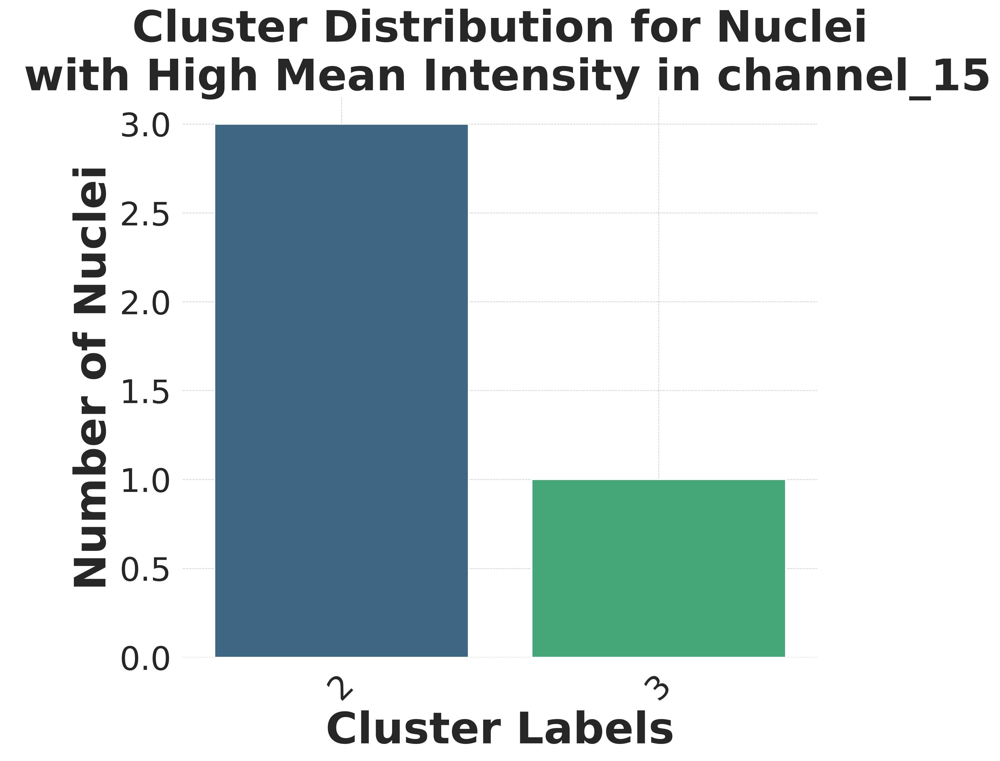

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


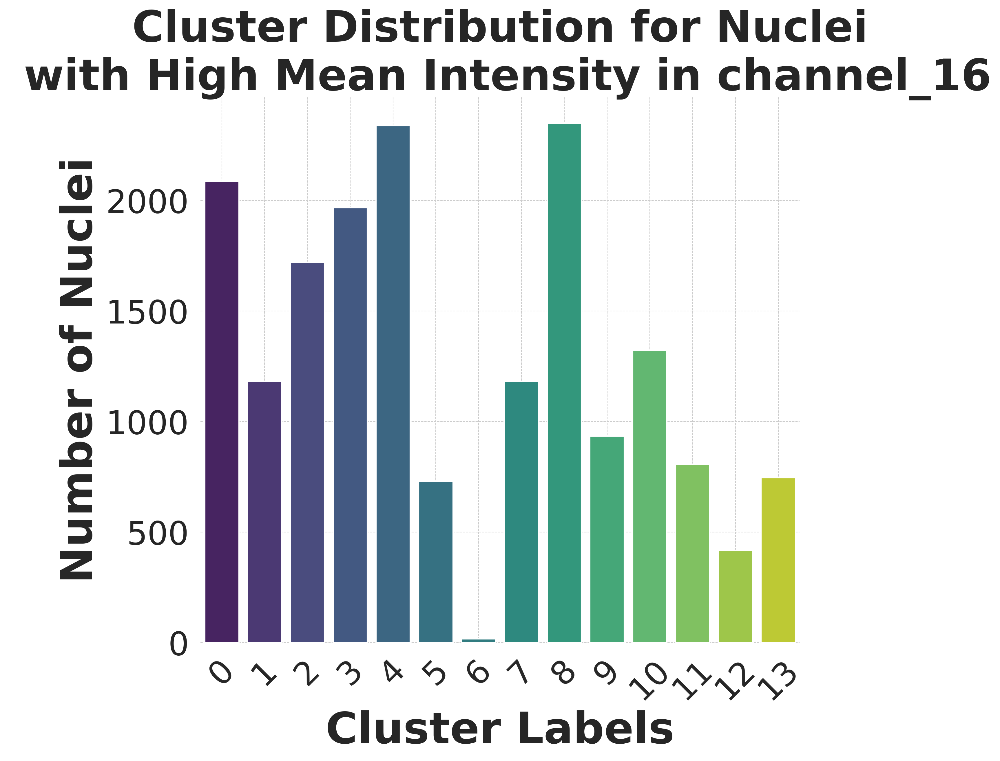

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


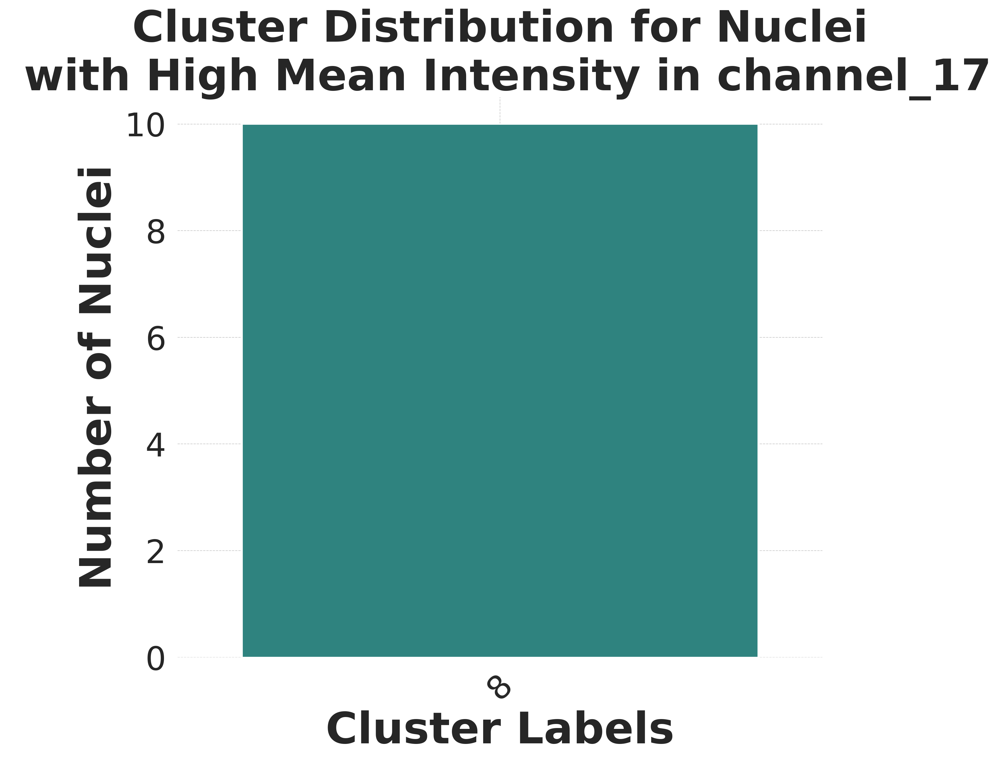

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


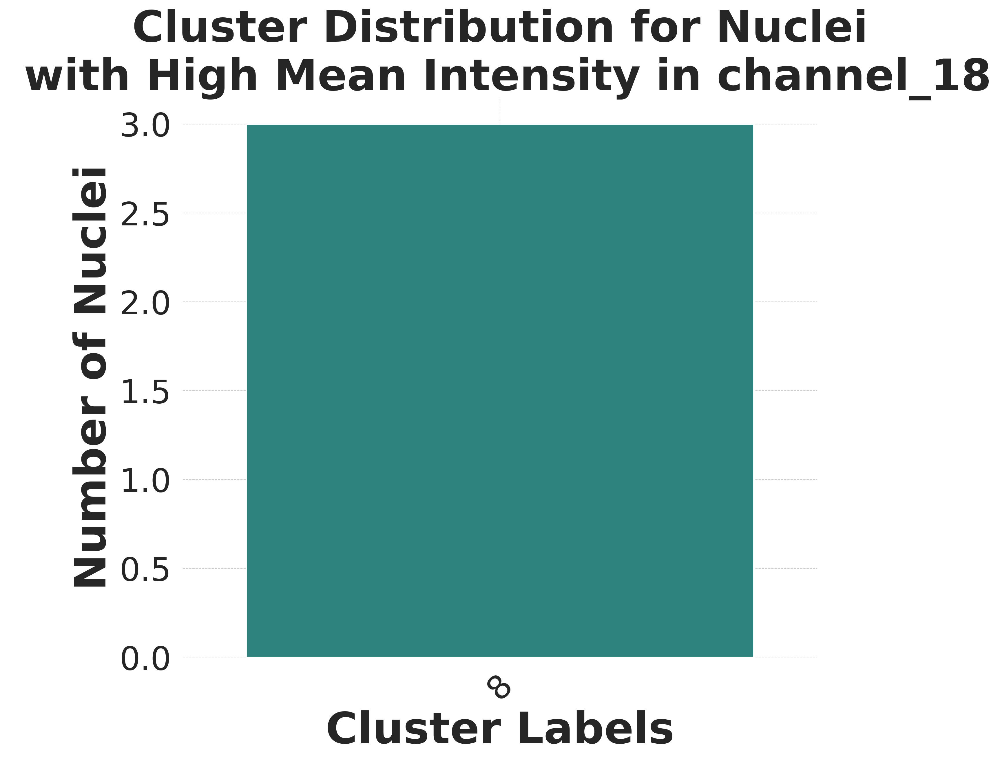

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


Saved plot for channel_19_mean to ./channel_19_mean_distribution_plot.png


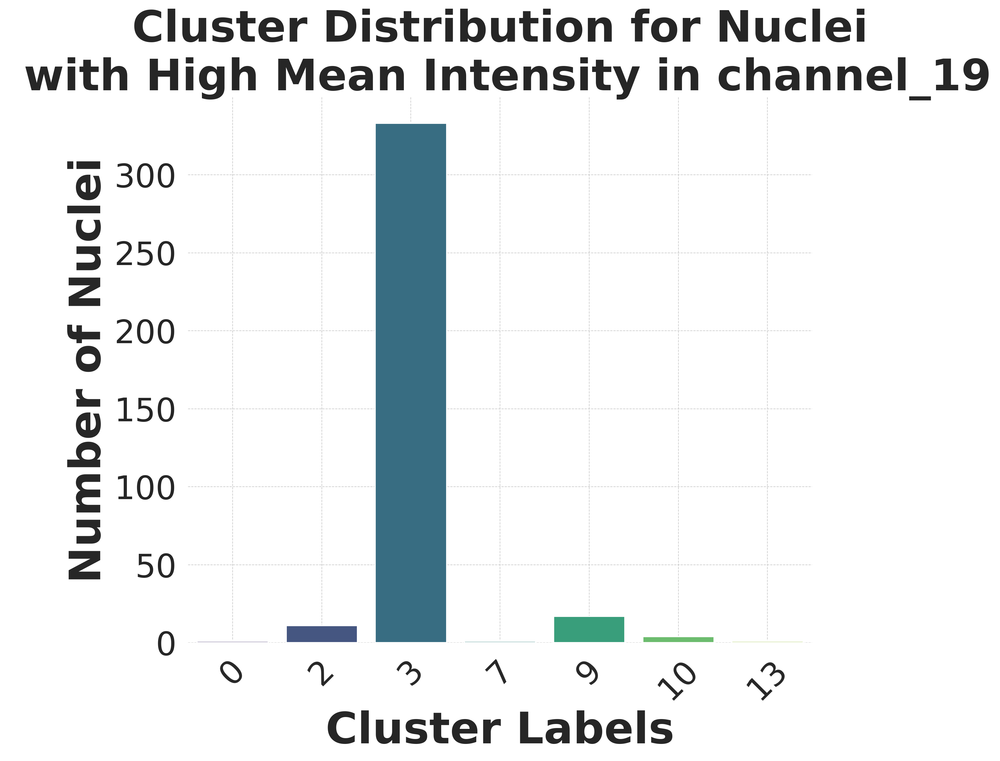

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


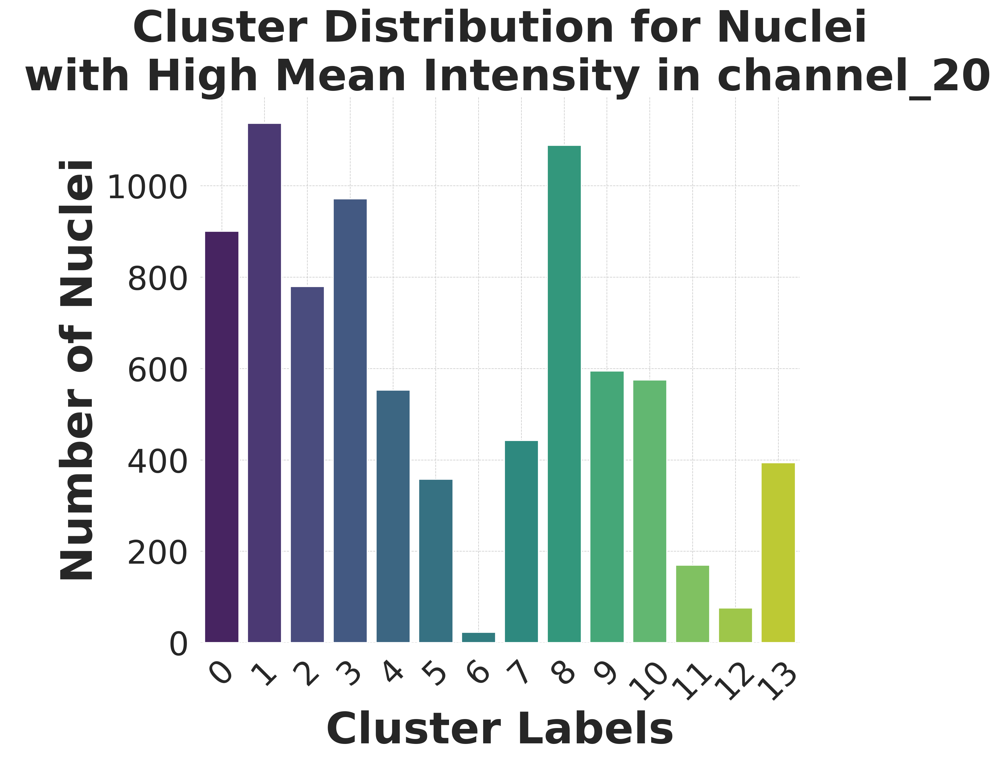

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


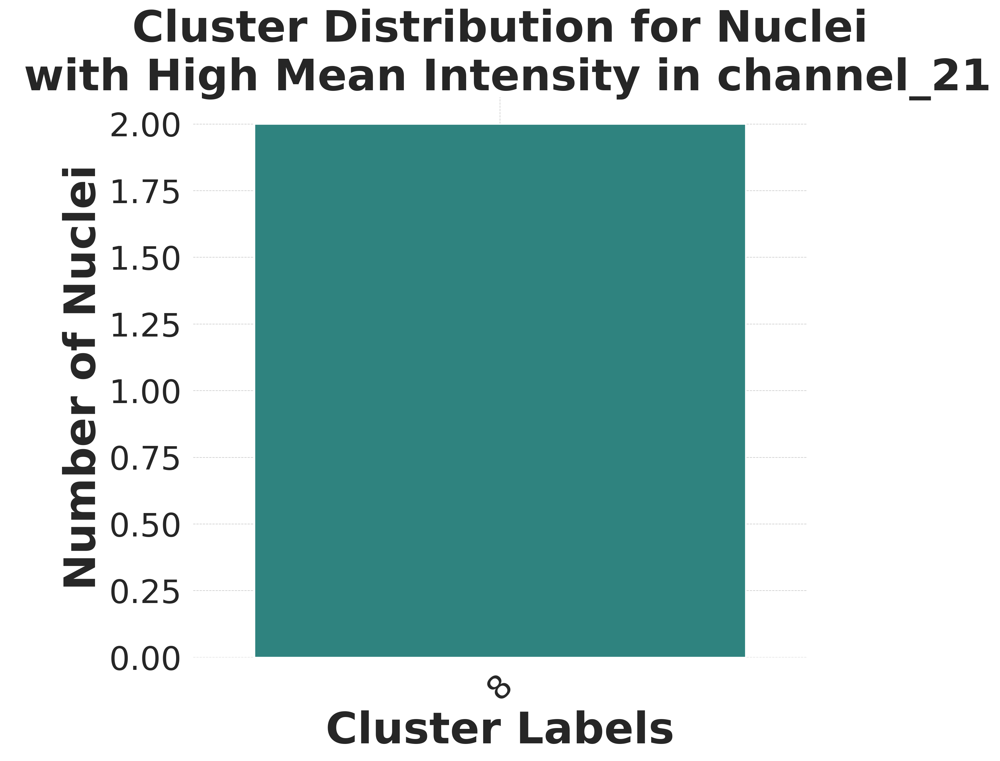

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


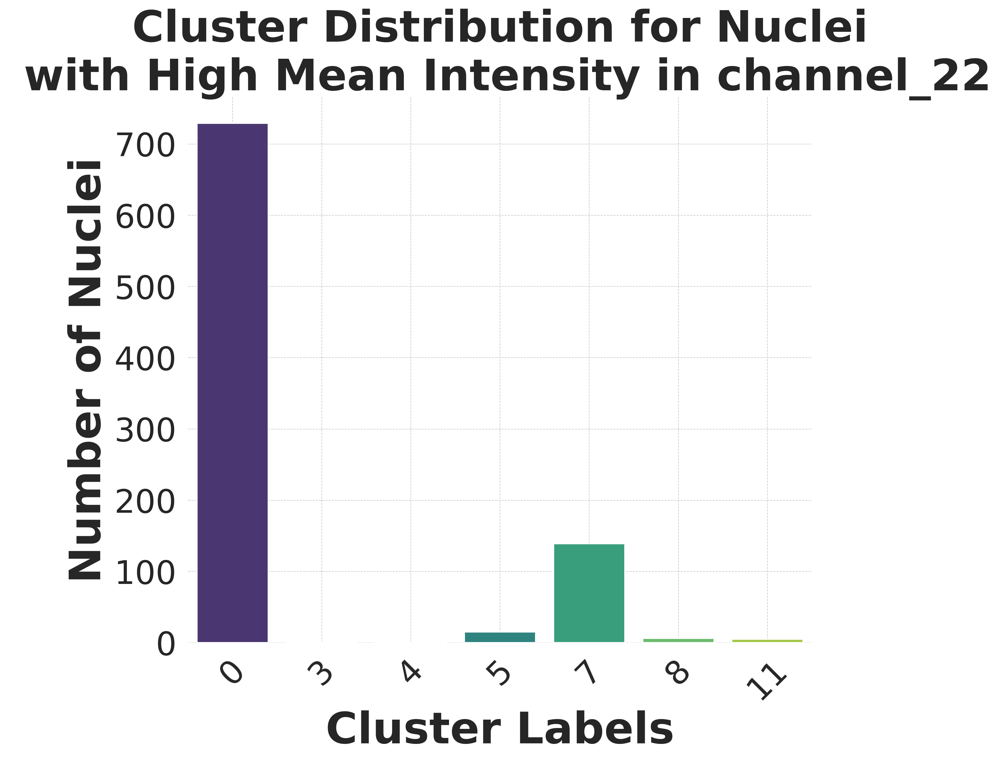

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


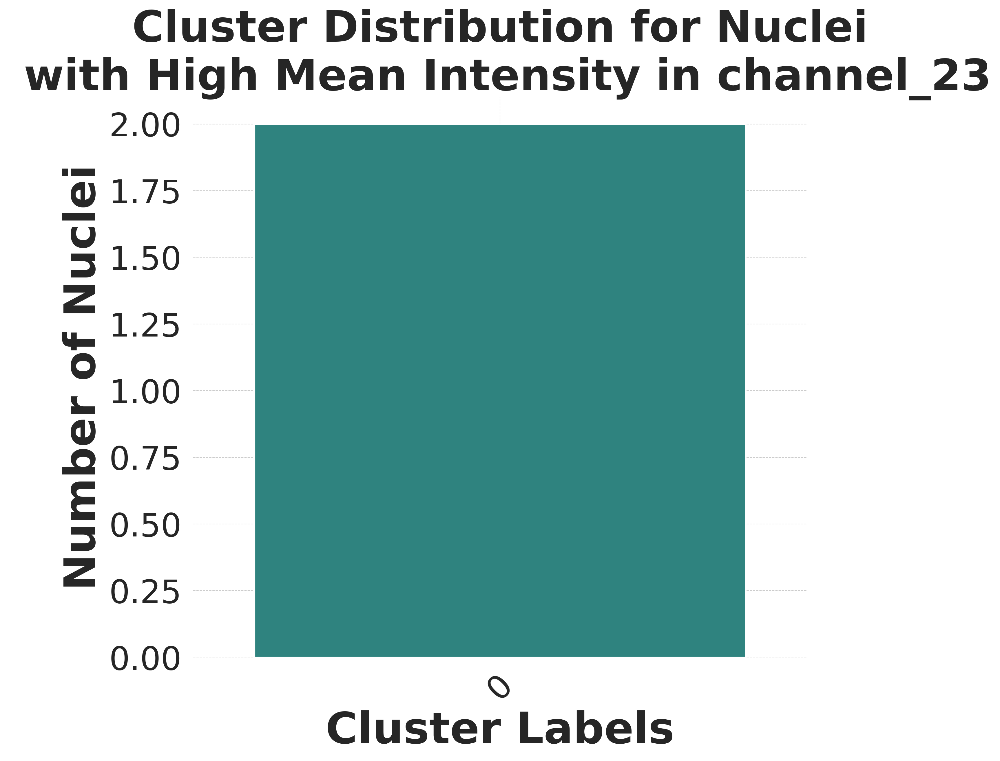

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


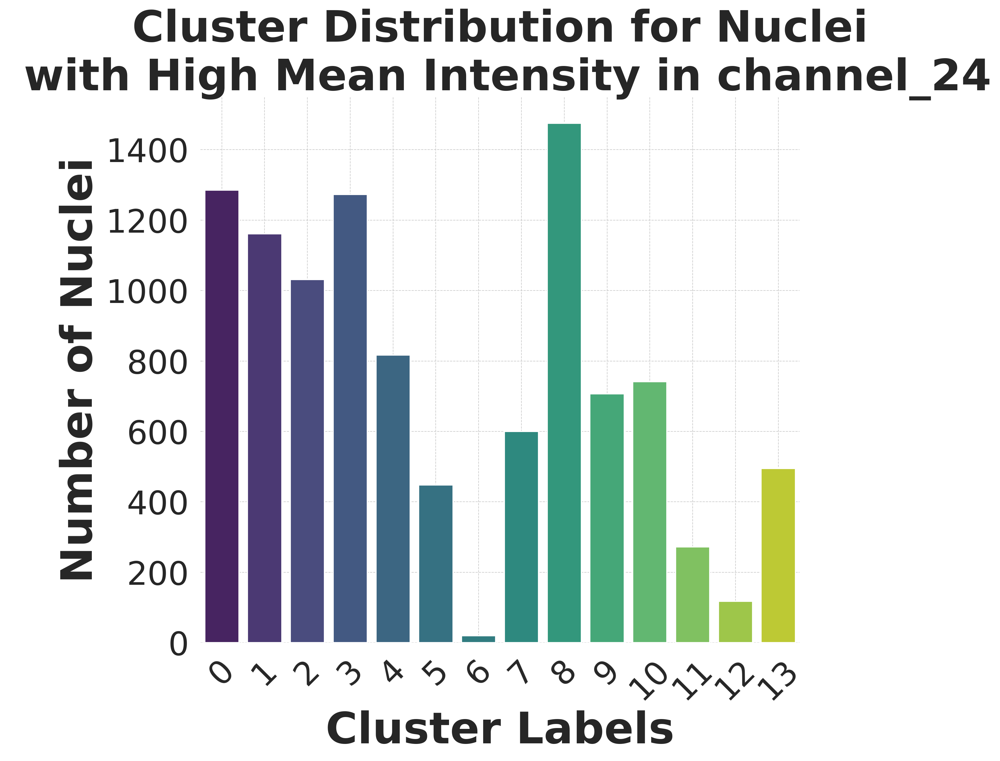

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


Saved plot for channel_25_mean to ./channel_25_mean_distribution_plot.png


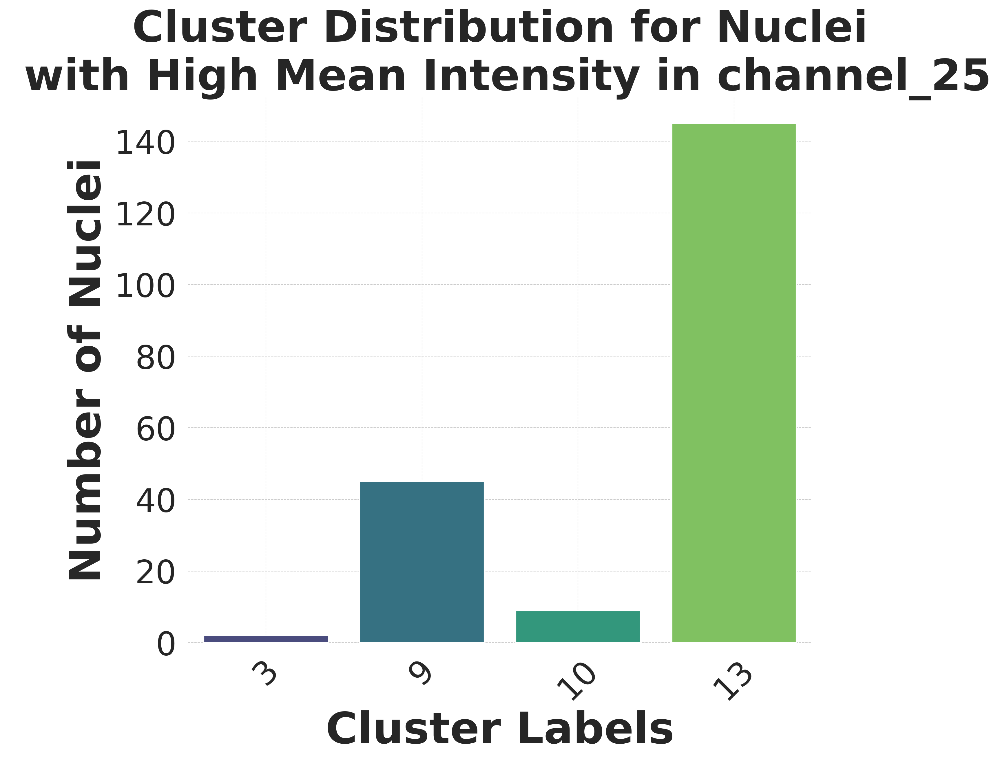

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


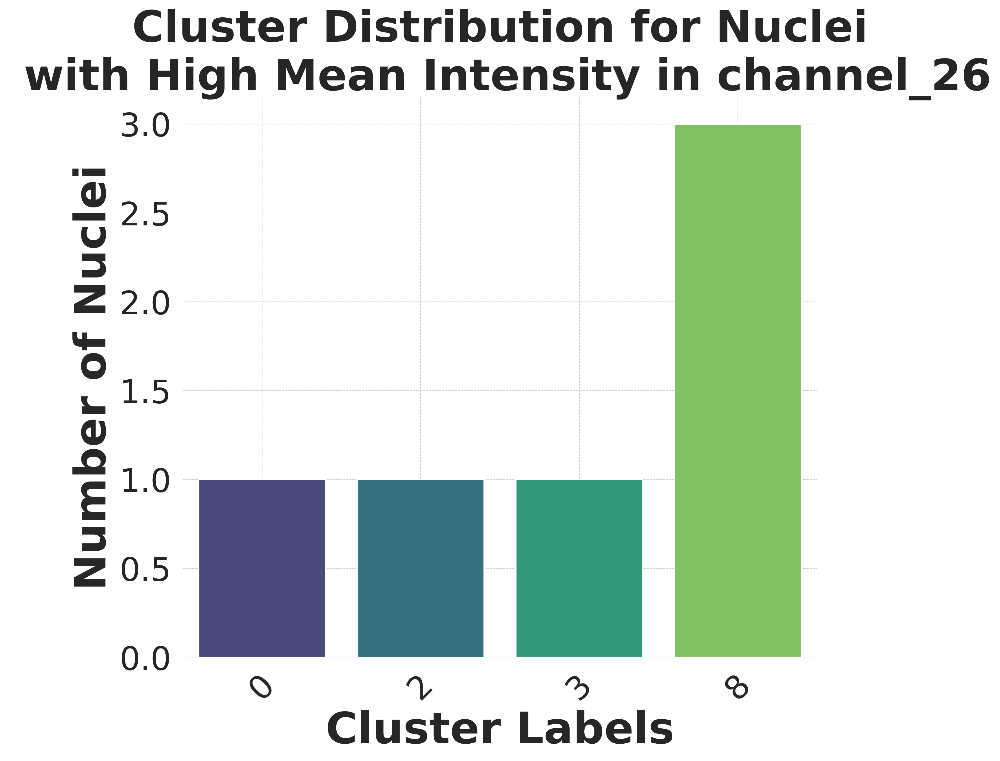

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


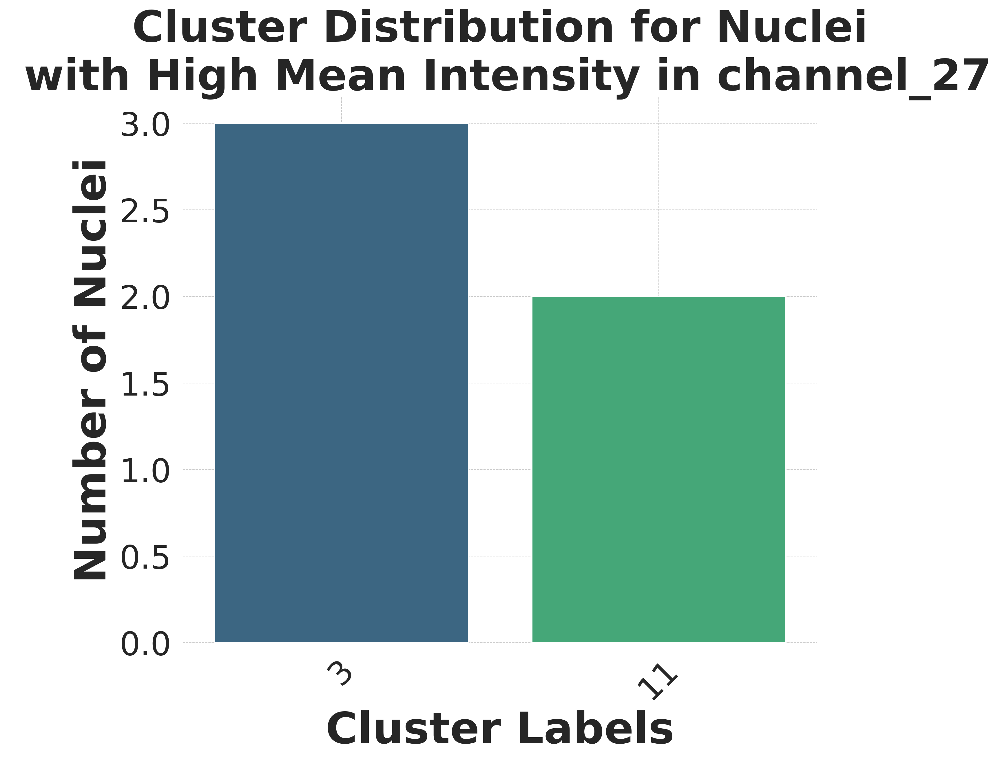

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


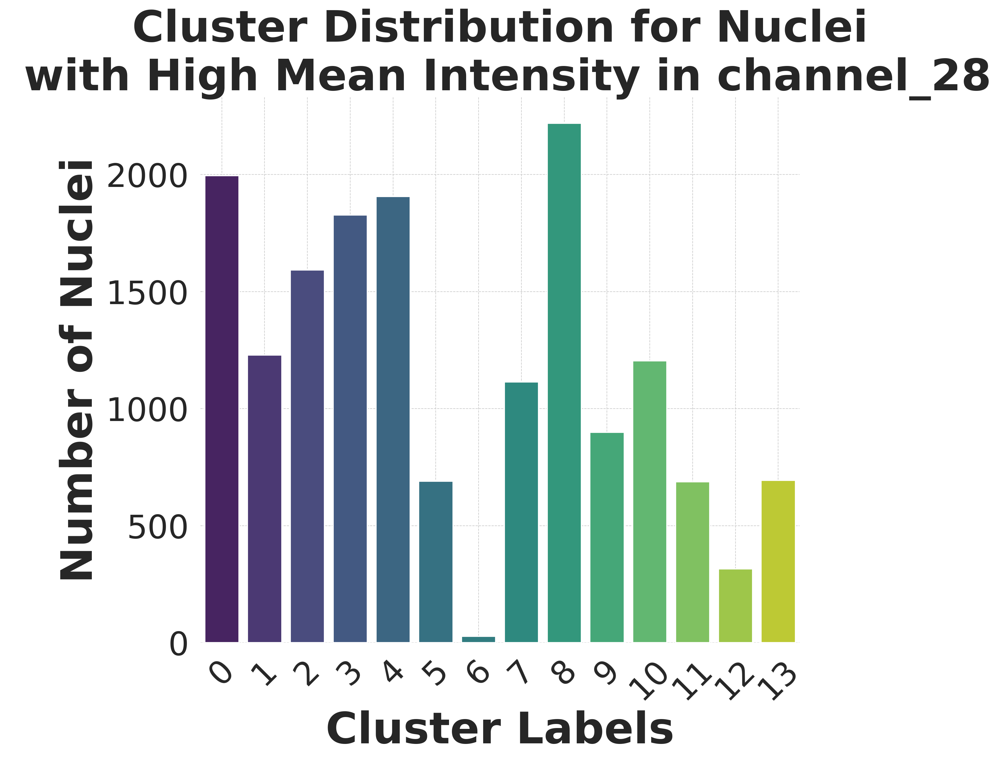

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


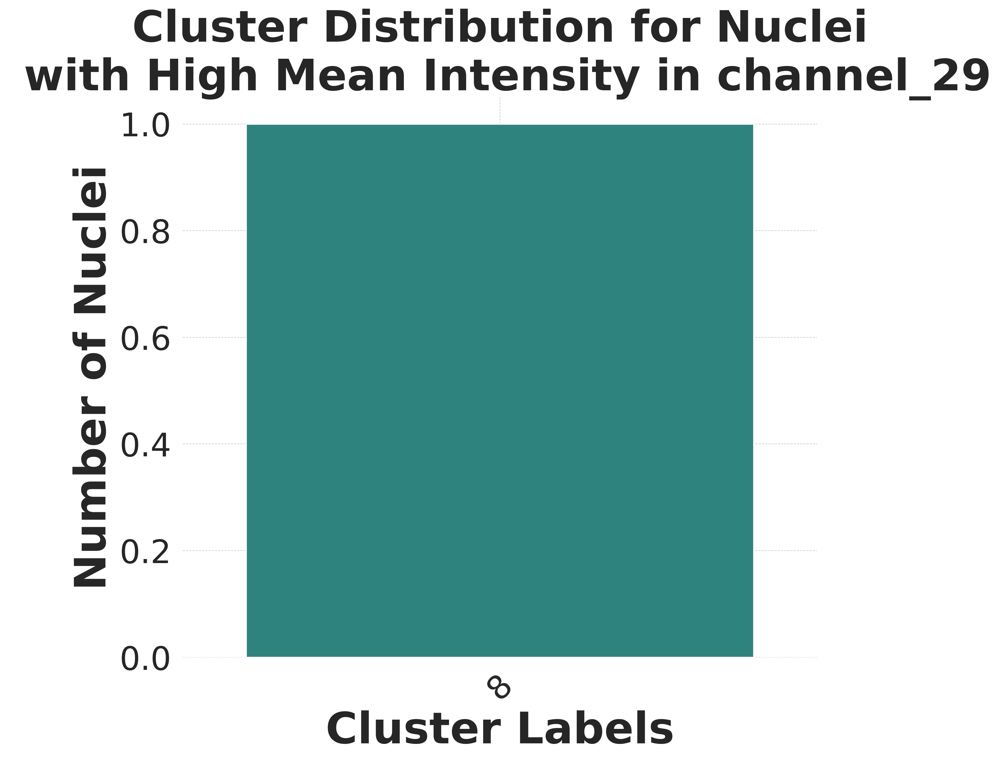

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


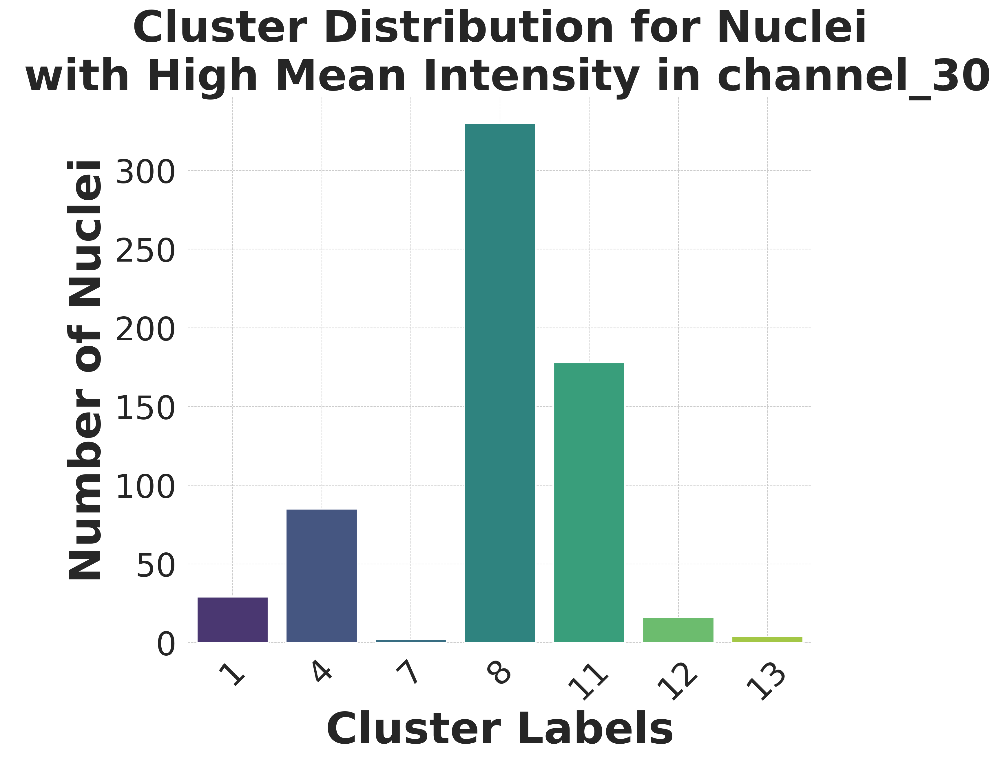

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


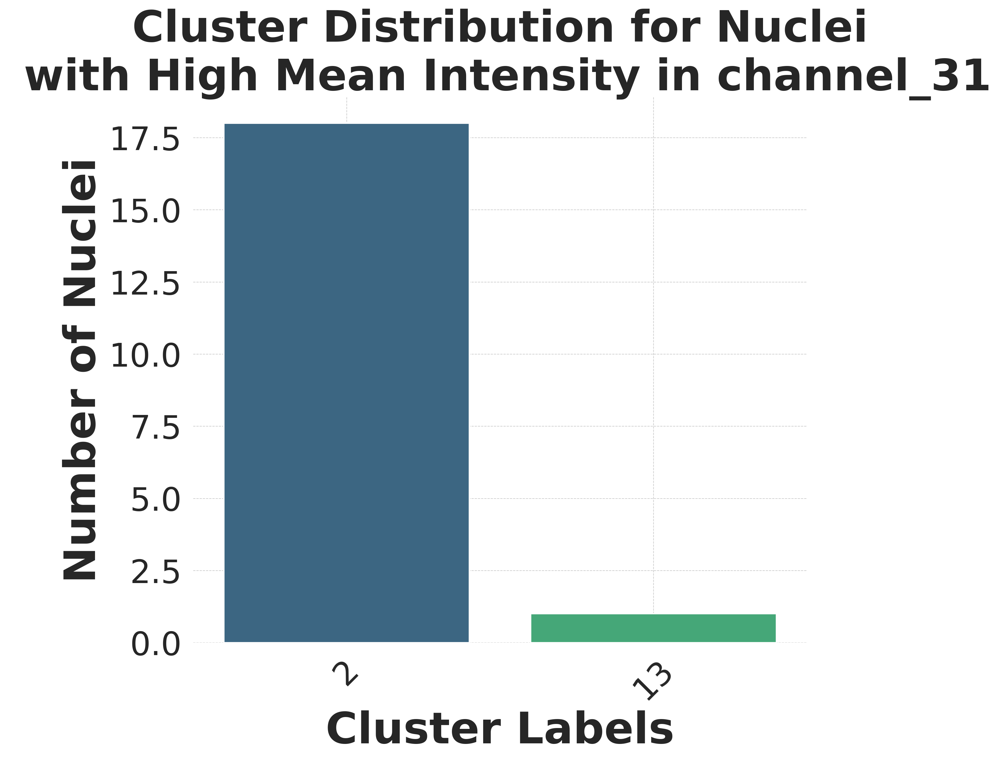

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


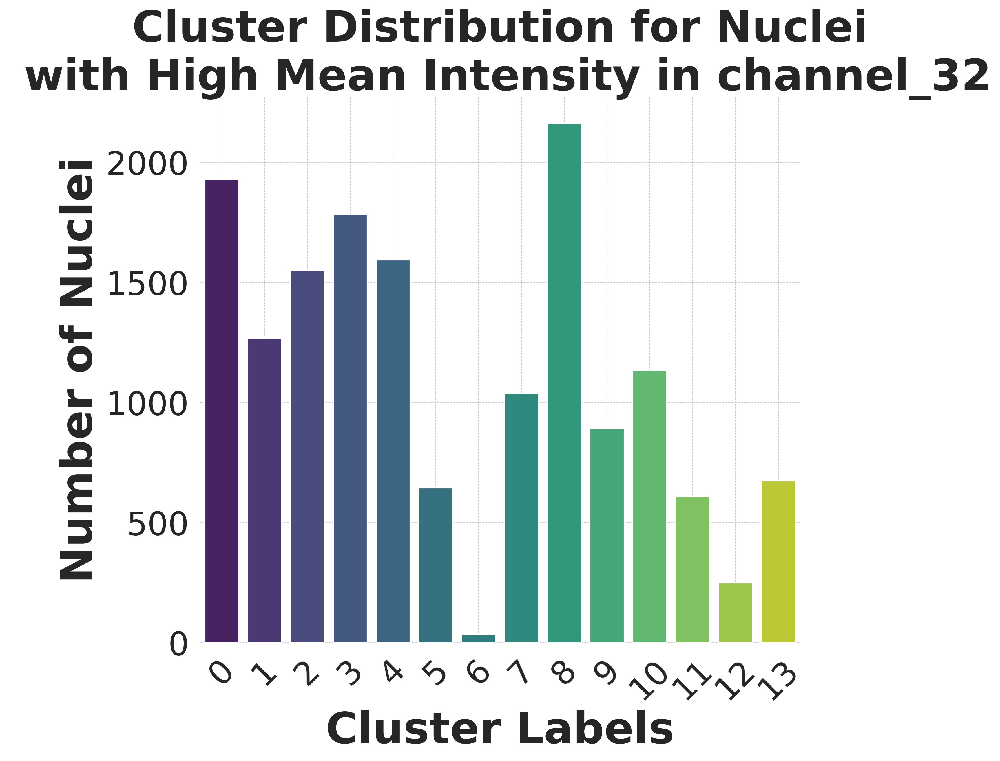

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


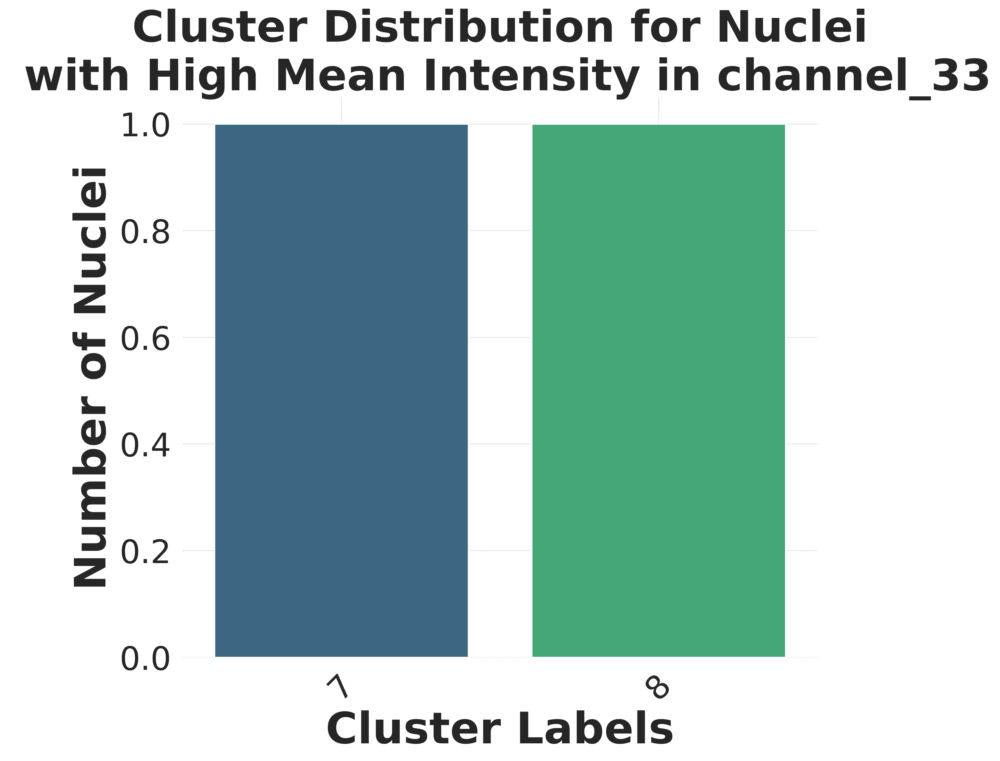

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


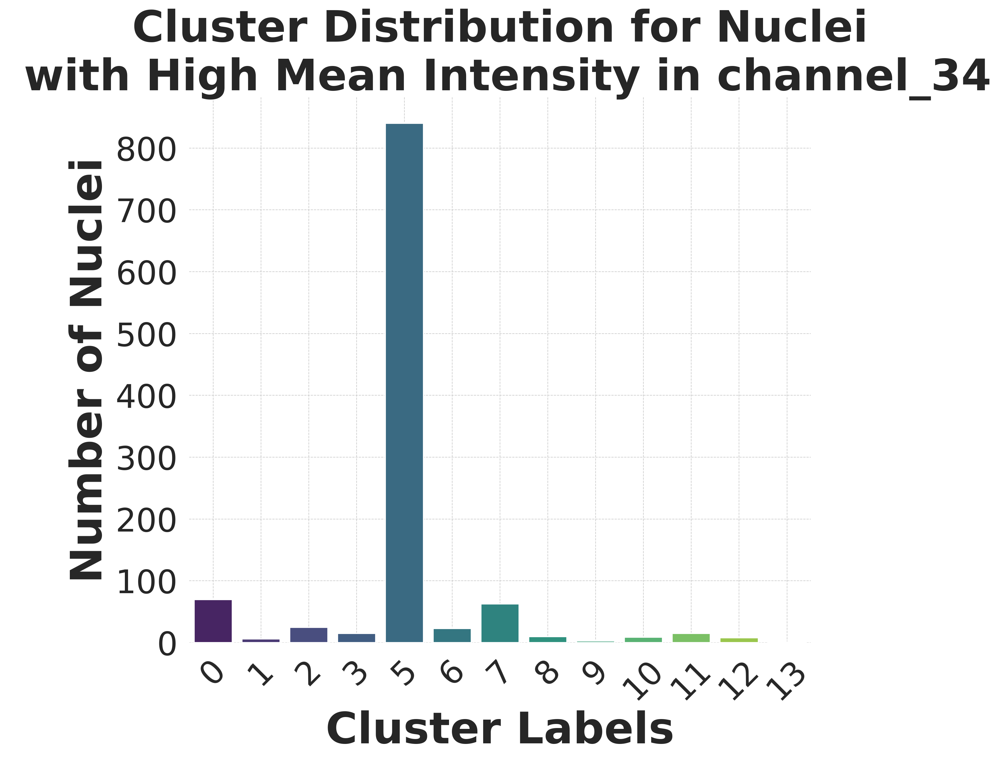

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


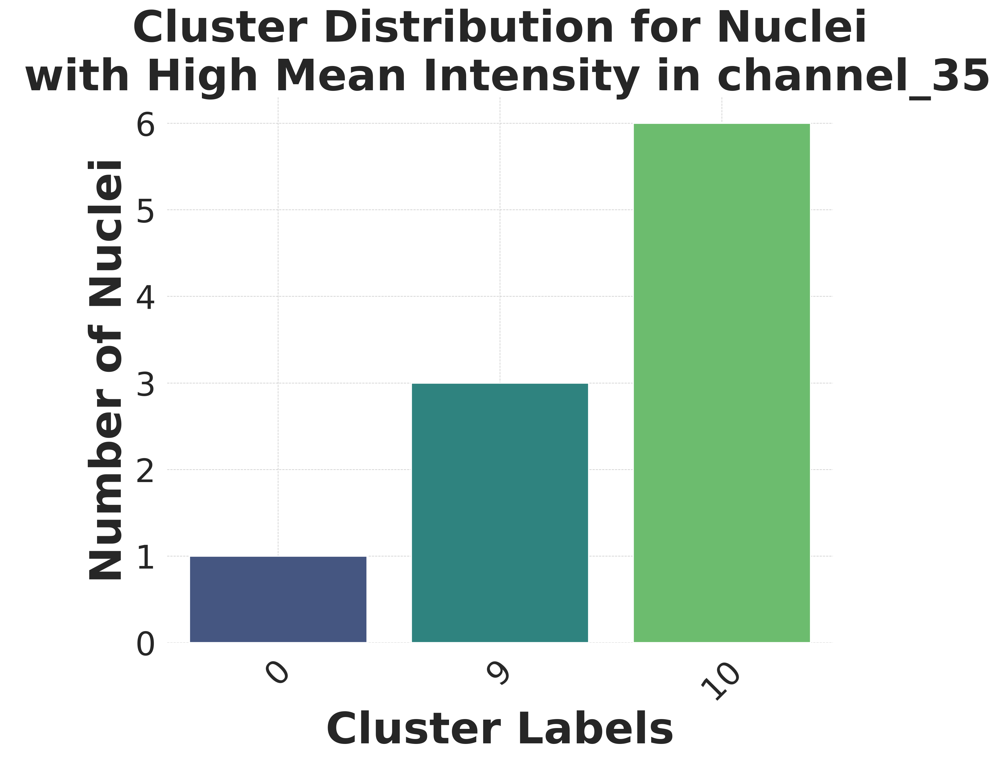

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


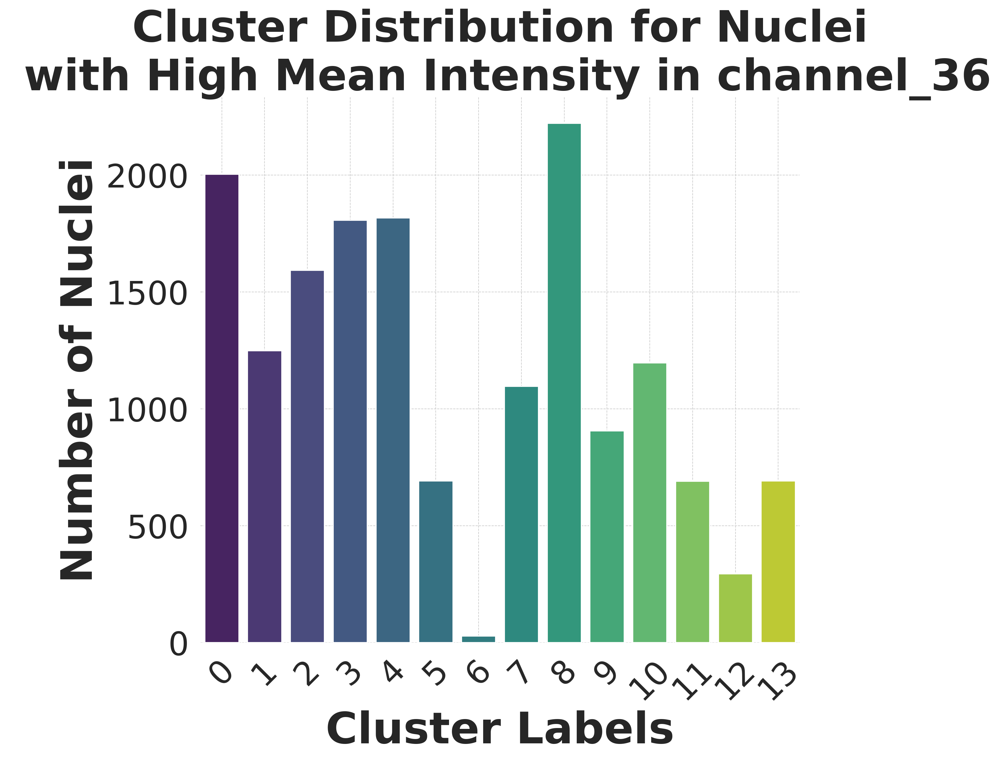

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


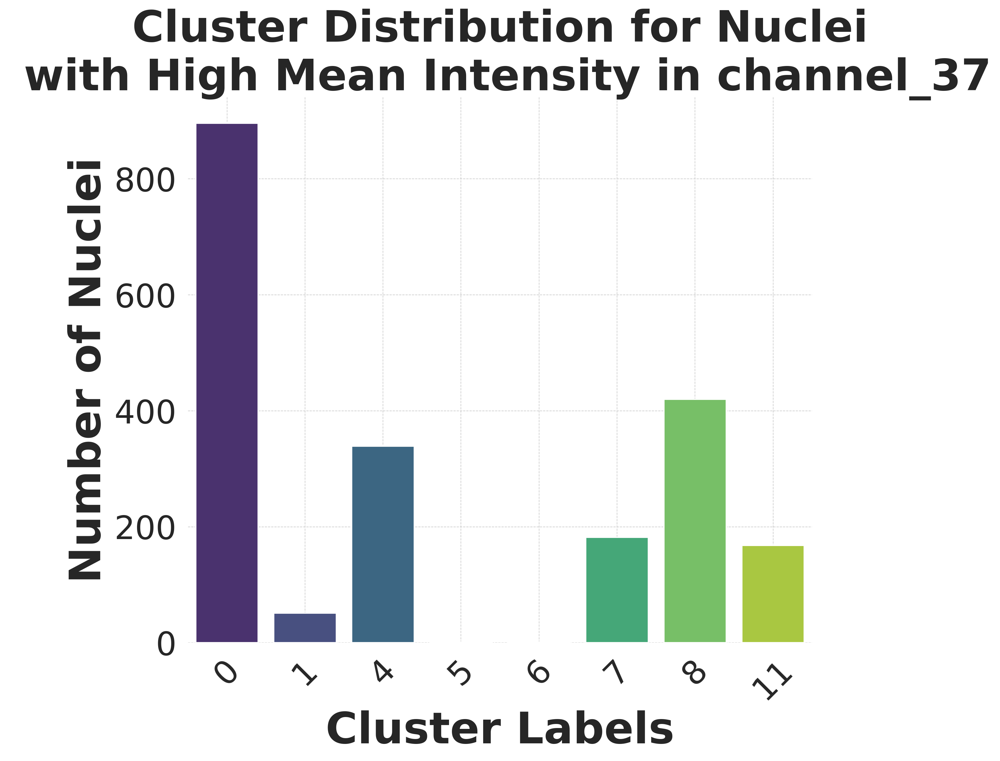

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


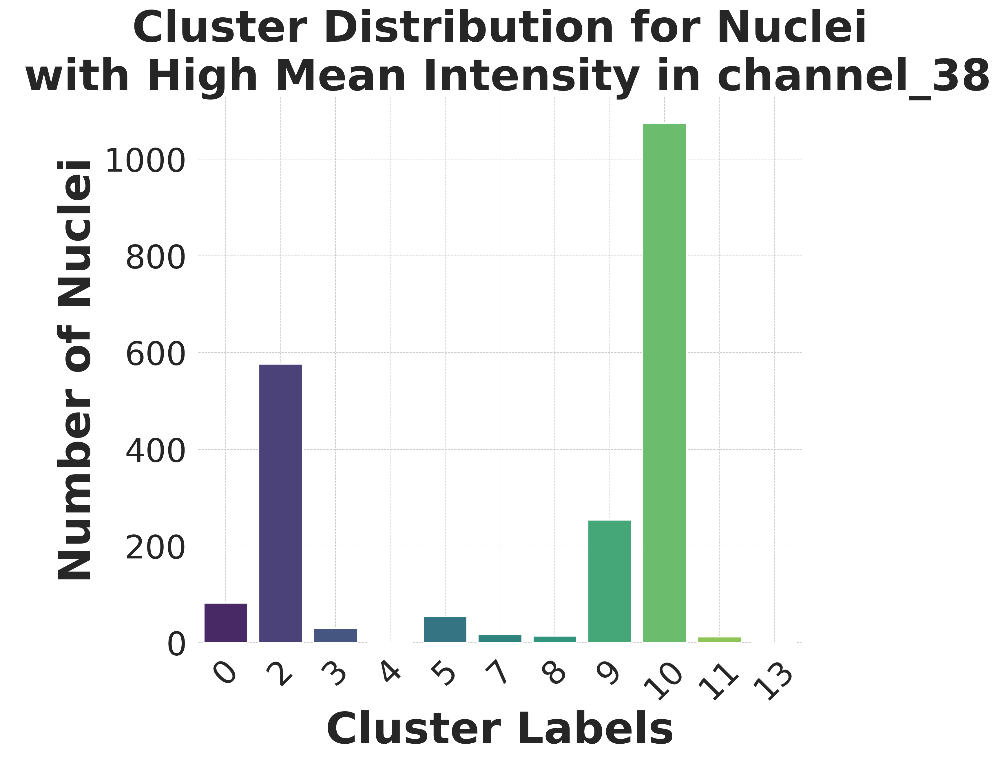

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


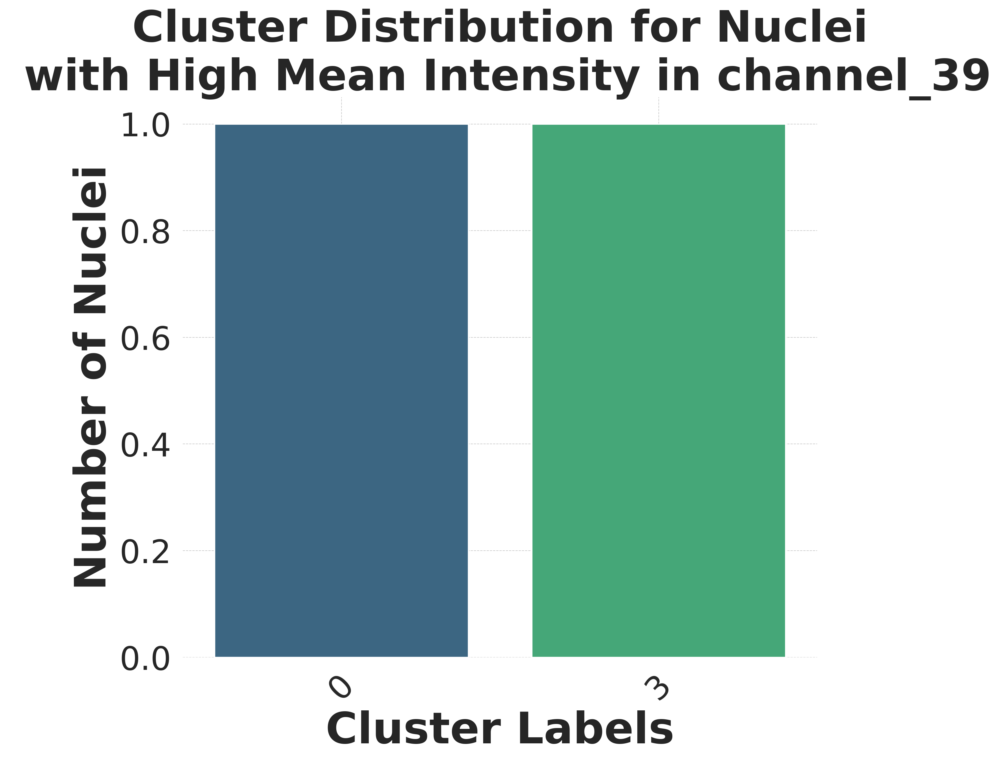

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


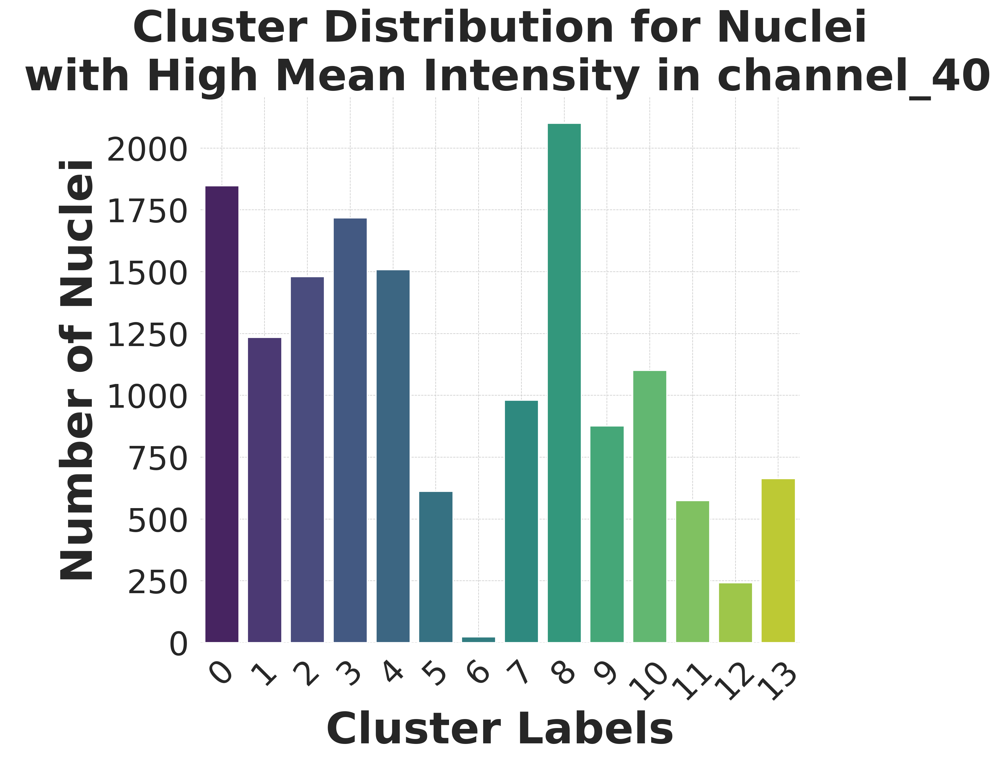

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


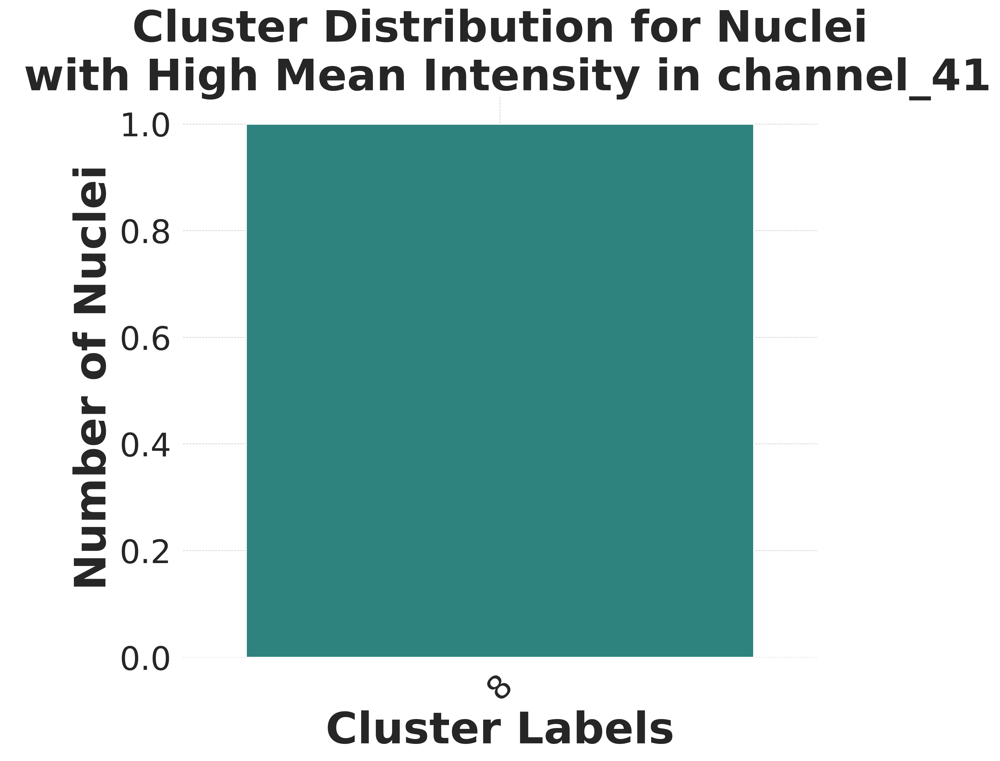

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


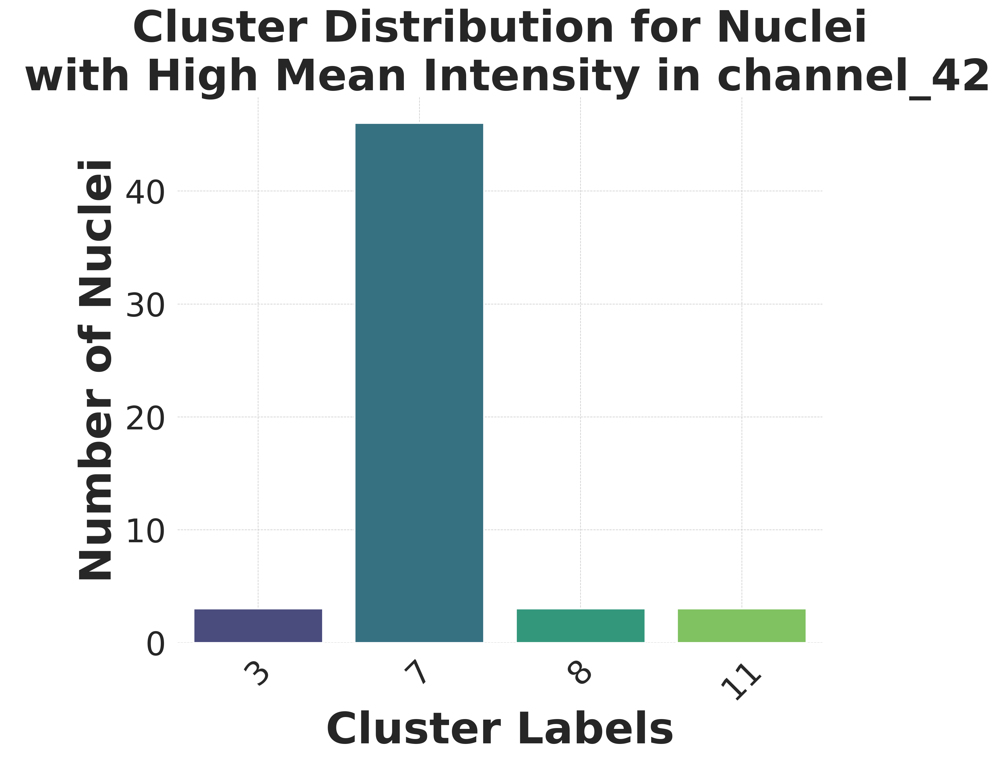

/scratch/local/23659016/ipykernel_2532425/3925293956.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")


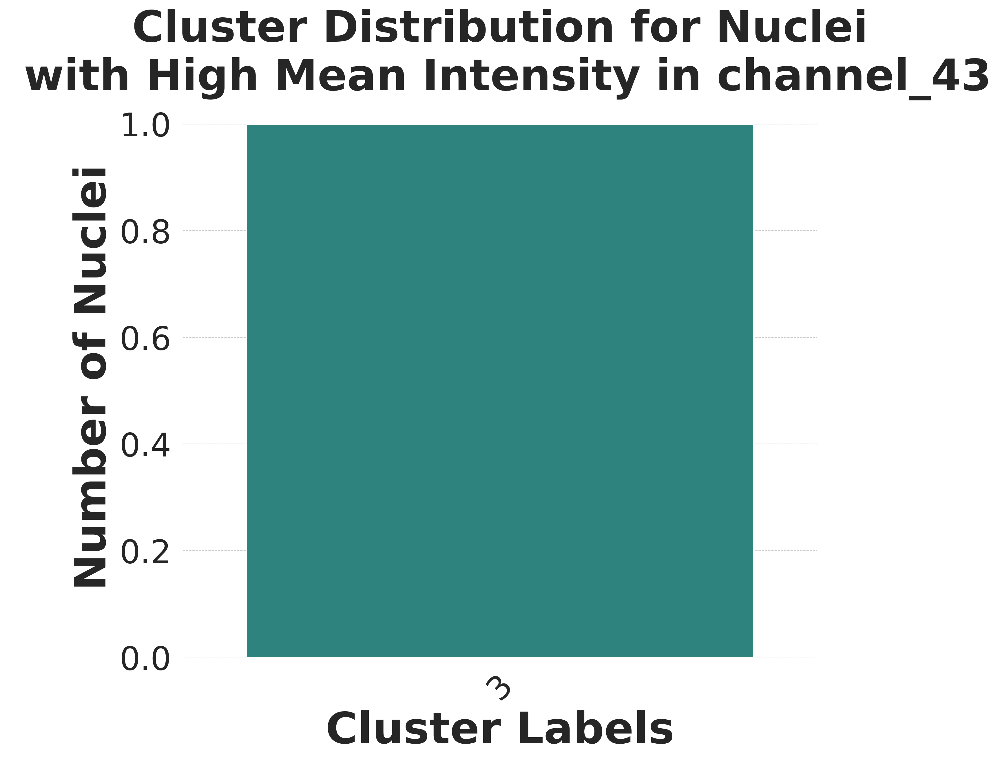

In [35]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Assuming features_df is your DataFrame
# channels = [col for col in features_df.columns if 'channel_' in col and '_mean' in col]

channels = [col for col in features_df.columns if 'channel_' in col and '_mean' in col]

intensity_threshold = 0.7

# Set the overall aesthetics for the plots
sns.set(style="whitegrid", palette="muted", font_scale=1.2)

# Specify channels for which to save the distribution
channels_to_save = ['channel_6_mean', 'channel_19_mean', 'channel_25_mean']

for channel in channels:
    # Create a mask for nuclei over the intensity threshold in the current channel
    mask = features_df[channel] > intensity_threshold

    # Apply the mask to isolate the relevant nuclei
    filtered_df = features_df[mask]

    # Analyze the distribution of cluster labels within this group
    cluster_distribution = filtered_df['cluster_labels'].value_counts().sort_index()

    # Check if the series is not empty
    if not cluster_distribution.empty:
        plt.figure(figsize=(9, 9), dpi=300)  # Adjust figure size to be square
        sns.barplot(x=cluster_distribution.index, y=cluster_distribution.values, palette="viridis")
        
        # Update the title and axis labels with bold font
        plt.title(f"Cluster Distribution for Nuclei\n with High Mean Intensity in {channel.replace('_mean', '')}", fontsize=36, fontweight='bold')
        plt.xlabel("Cluster Labels", fontsize=36, fontweight='bold')
        plt.ylabel("Number of Nuclei", fontsize=36, fontweight='bold')
        plt.xticks(rotation=45, fontsize=27)  # Make cluster numbers bold
        plt.yticks(fontsize=27)  # Make Y-axis ticks bold
        
        plt.grid(True, which="both", ls="--", linewidth=0.5)
        sns.despine(left=True, bottom=True)  # Keep the plot clean
        plt.tight_layout()  # Adjust layout
        
        if channel in channels_to_save:
            # Save the plot in PNG format with high DPI
            save_path = f"./{channel}_distribution_plot.png"
            plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')
            print(f"Saved plot for {channel} to {save_path}")
        
        plt.show()
    else:
        print(f"No nuclei exceeded the intensity threshold for {channel}")


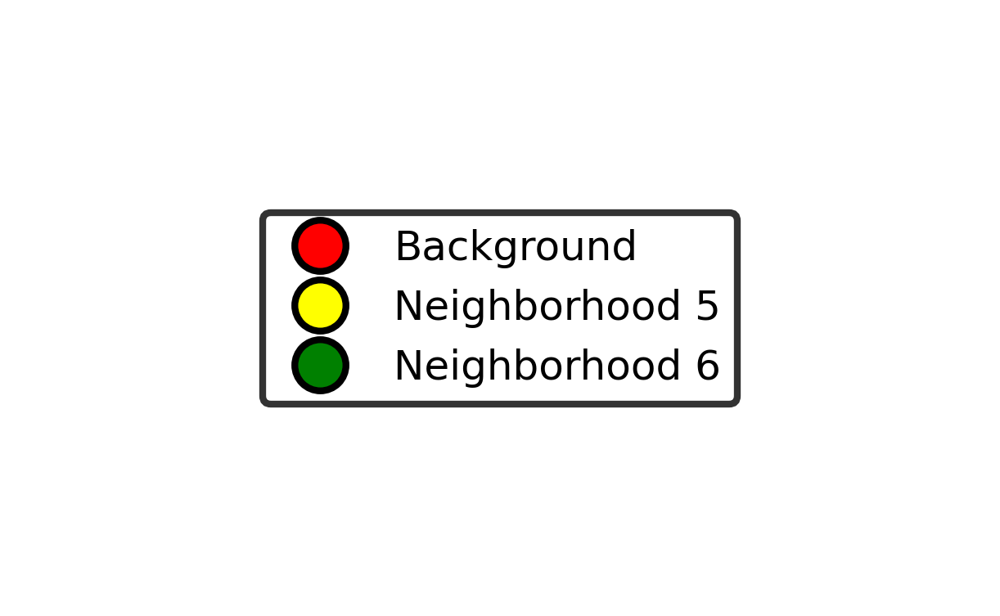

Saved legend path: legend_high_quality.svg


In [2]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Create a figure and a subplot with higher resolution
fig, ax = plt.subplots(figsize=(5, 3), dpi=300)  # Larger figure size and higher DPI for better quality

# Define the colors and labels for the legend
colors = ['red', 'yellow', 'green']
labels = ['Background', 'Neighborhood 5', 'Neighborhood 6']
# Increase marker size and use a more visible marker edge for better visibility
handles = [plt.Line2D([0], [0], marker='o', color=color, label=label,
                      markersize=15, linestyle='None', markeredgewidth=2, markeredgecolor='black')
           for color, label in zip(colors, labels)]

# Create the legend with larger font size
legend = ax.legend(handles=handles, loc='center', fontsize='large', frameon=True)
ax.axis('off')  # Remove the axes

# Increase the padding within the legend box
legend.get_frame().set_linewidth(2.0)  # Thicker frame for the legend
legend.get_frame().set_edgecolor('black')  # Black edge for the legend

# Save the figure as SVG
save_path = 'legend_high_quality.svg'
plt.savefig(save_path, format='svg', bbox_inches='tight')

# Display the legend
plt.show()

# Output the path to the saved image file
print("Saved legend path:", save_path)


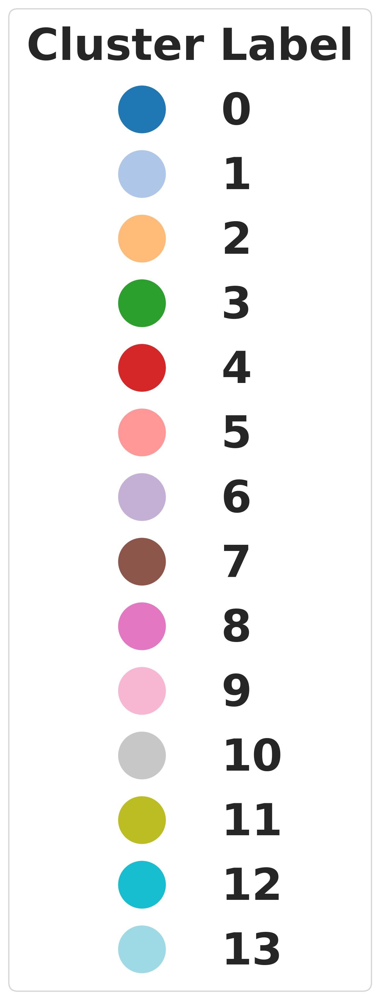

'./legend_tab20_high_res.png'

In [68]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

# Number of clusters
num_clusters = 14

# Generate a color map with 'tab20'
tab20_colors = plt.cm.tab20(np.linspace(0, 1, num_clusters))
tab20_cmap = ListedColormap(tab20_colors[:num_clusters])

# Create a figure and a subplot
fig, ax = plt.subplots(figsize=(4.5, 9), dpi=300)

# Create a list of legend handles with bold labels
legend_handles = [plt.Line2D([0], [0], marker='o', color=tab20_cmap(i), label=str(i),
                             markersize=36, linestyle='None', markeredgewidth=3) for i in range(num_clusters)]

# Create the legend with bold labels and title
legend = ax.legend(handles=legend_handles, title='Cluster Label', loc='center', fontsize=36, title_fontsize='36')

# Set the legend title to bold
legend.get_title().set_fontweight('bold')

# Set the legend text to bold
for text in legend.get_texts():
    text.set_fontweight('bold')

# Remove the axes
ax.axis('off')

# Save the legend as a separate figure
save_path = './legend_tab20_high_res.png'
plt.savefig(save_path, bbox_inches='tight')

# Display the legend
plt.show()

# Output the path to the saved image file
save_path



Cluster distribution for nuclei with high channel_0_mean:
cluster_labels
0     769
1    1172
2    1282
3     287
4     612
5     342
6     295
7     666
8     646
Name: count, dtype: int64


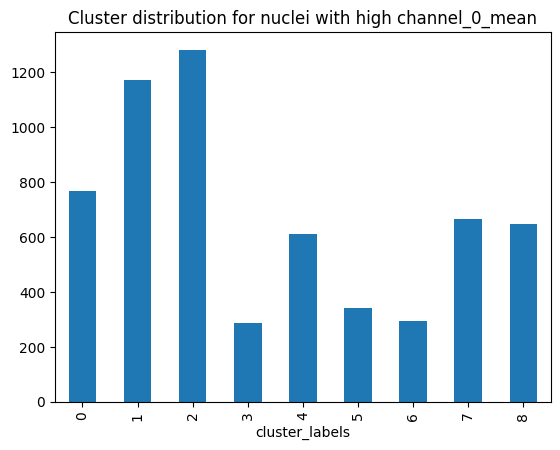


Cluster distribution for nuclei with high channel_1_mean:
cluster_labels
1    1
Name: count, dtype: int64


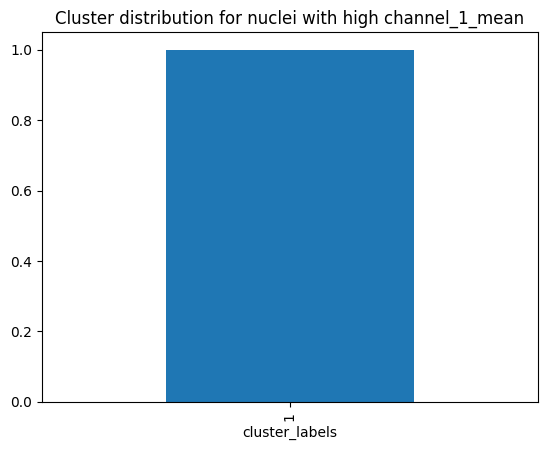


Cluster distribution for nuclei with high channel_2_mean:
cluster_labels
3    47
7     1
Name: count, dtype: int64


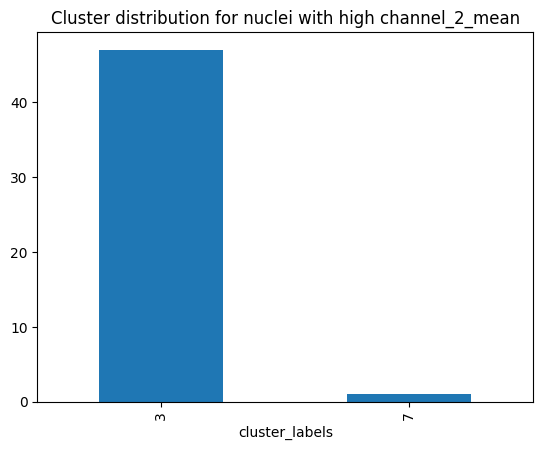


Cluster distribution for nuclei with high channel_3_mean:
cluster_labels
1    1
3    2
Name: count, dtype: int64


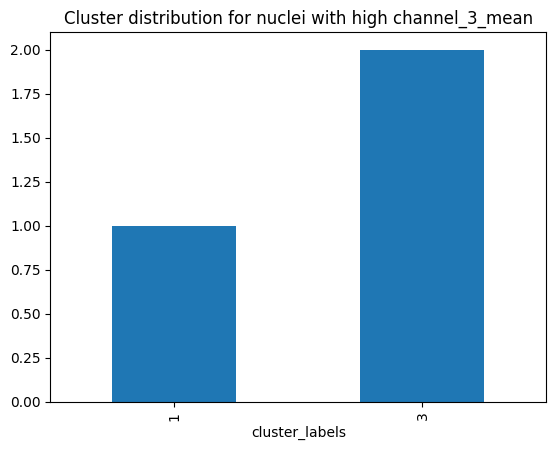


Cluster distribution for nuclei with high channel_4_mean:
cluster_labels
0     904
1    2040
2    2018
3     573
4    1208
5     831
6     455
7    1068
8     985
Name: count, dtype: int64


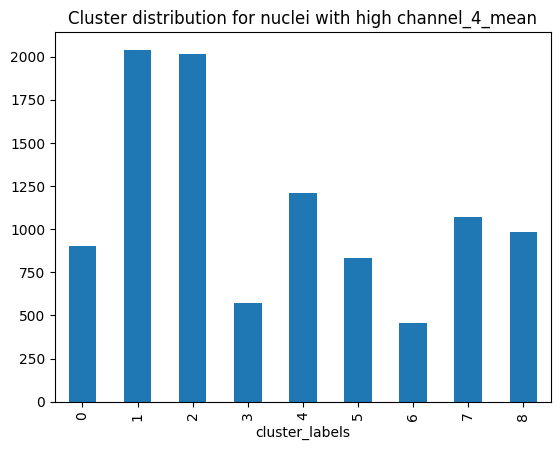


Cluster distribution for nuclei with high channel_5_mean:
cluster_labels
3    1
Name: count, dtype: int64


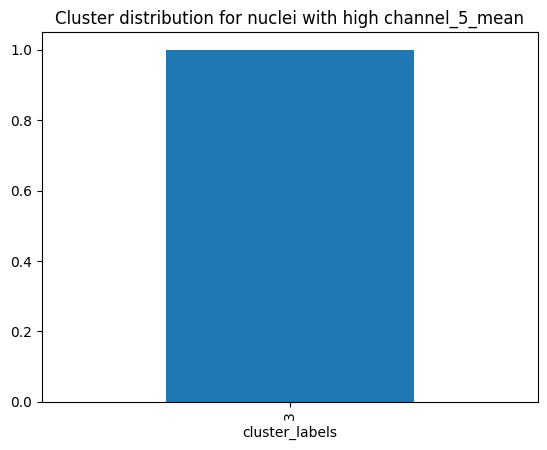


Cluster distribution for nuclei with high channel_6_mean:
cluster_labels
0      2
2    359
3      7
4      6
6      4
7     15
8     92
Name: count, dtype: int64


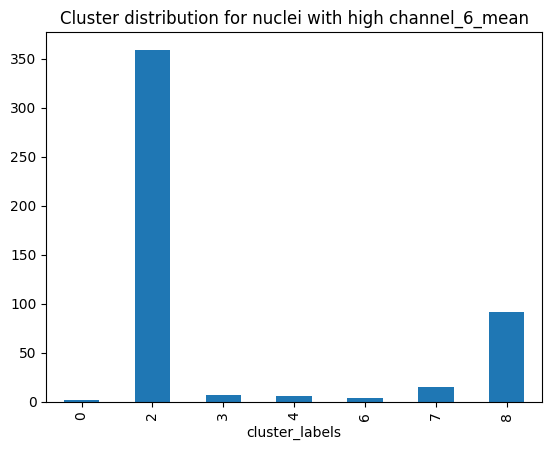


Cluster distribution for nuclei with high channel_7_mean:
cluster_labels
2    4
7    2
Name: count, dtype: int64


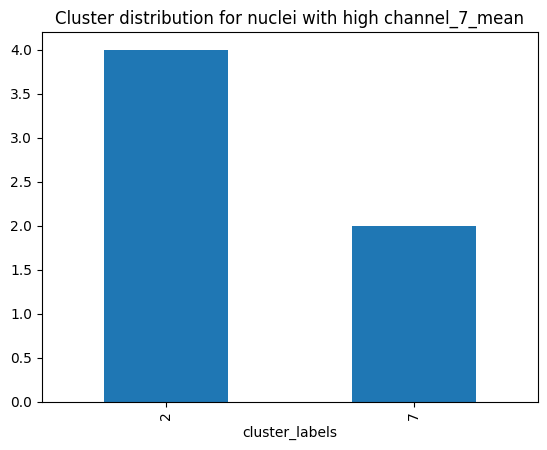


Cluster distribution for nuclei with high channel_8_mean:
cluster_labels
0    1043
1    2852
2    2768
3     928
4    1689
5    1559
6     601
7    1395
8    1189
Name: count, dtype: int64


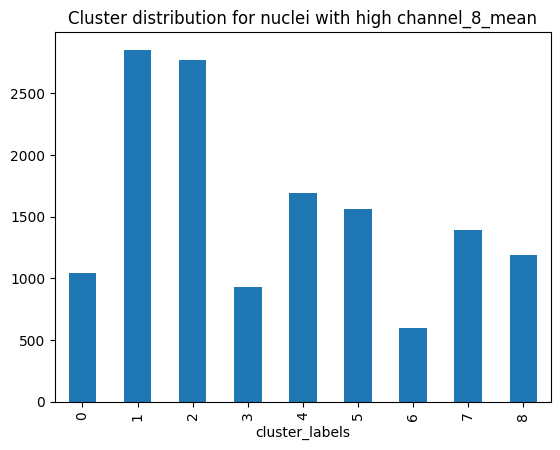


Cluster distribution for nuclei with high channel_9_mean:
cluster_labels
5    1
Name: count, dtype: int64


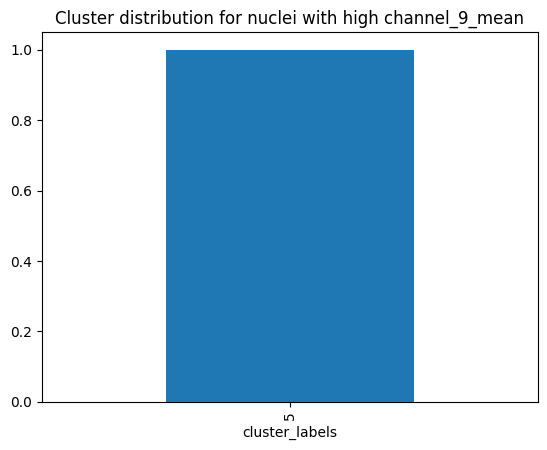


Cluster distribution for nuclei with high channel_10_mean:
cluster_labels
2    10
3     2
Name: count, dtype: int64


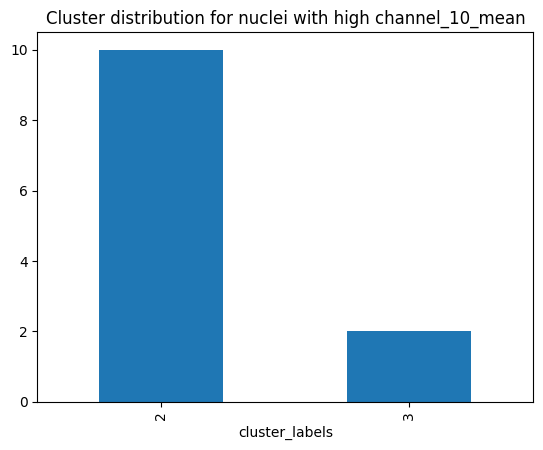


Cluster distribution for nuclei with high channel_11_mean:
cluster_labels
1    1
2    1
5    1
Name: count, dtype: int64


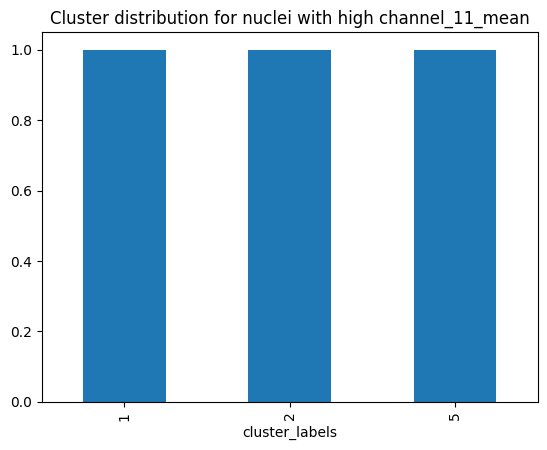


Cluster distribution for nuclei with high channel_12_mean:
cluster_labels
0     918
1    2323
2    2276
3     694
4    1360
5     998
6     481
7    1217
8    1077
Name: count, dtype: int64


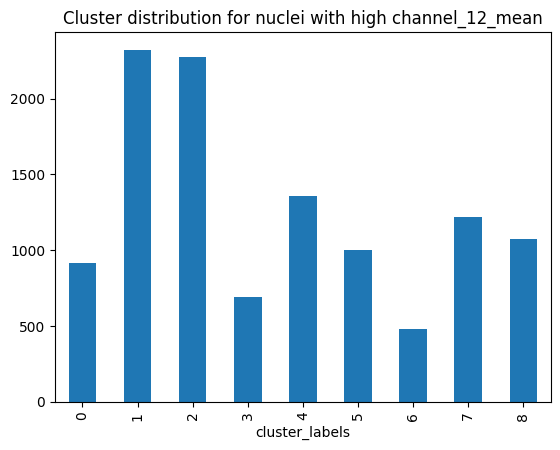


Cluster distribution for nuclei with high channel_13_mean:
cluster_labels
2    2
Name: count, dtype: int64


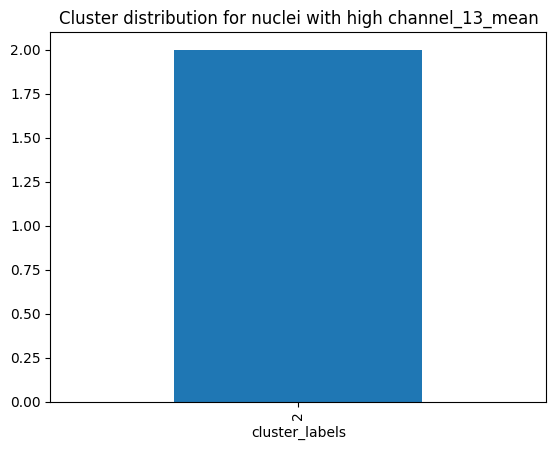


Cluster distribution for nuclei with high channel_14_mean:
cluster_labels
3    6
Name: count, dtype: int64


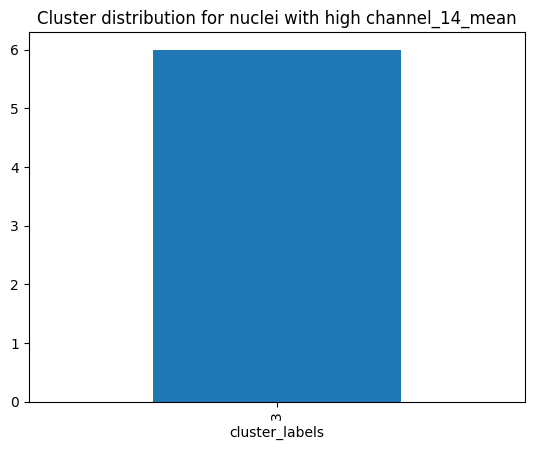


Cluster distribution for nuclei with high channel_15_mean:
cluster_labels
2    4
Name: count, dtype: int64


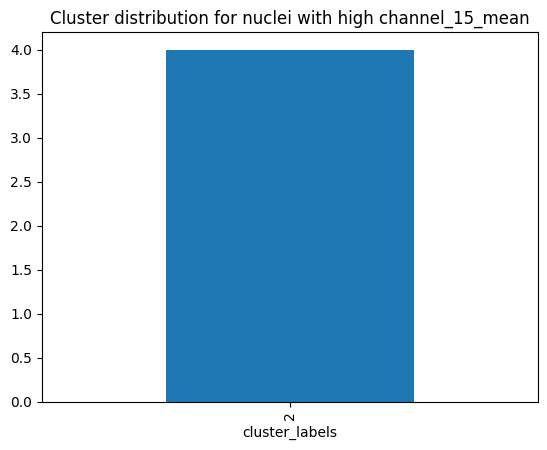


Cluster distribution for nuclei with high channel_16_mean:
cluster_labels
0    1291
1    3529
2    3489
3    1204
4    2069
5    2316
6     734
7    1746
8    1430
Name: count, dtype: int64


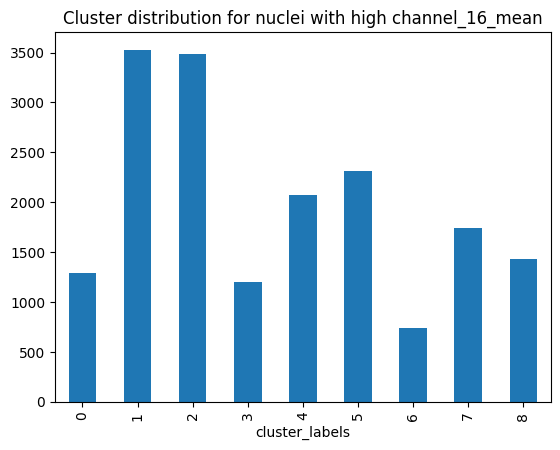


Cluster distribution for nuclei with high channel_17_mean:
cluster_labels
1    9
3    1
Name: count, dtype: int64


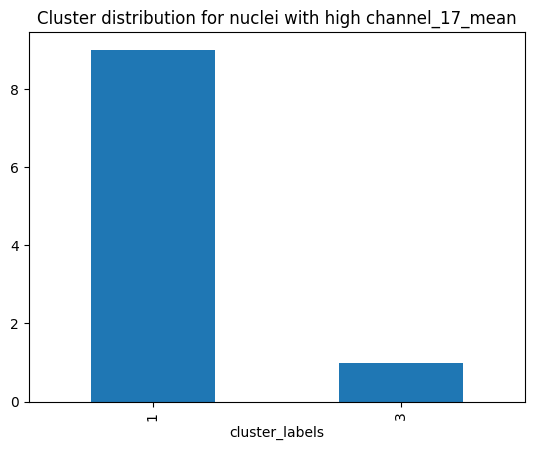


Cluster distribution for nuclei with high channel_18_mean:
cluster_labels
3    3
Name: count, dtype: int64


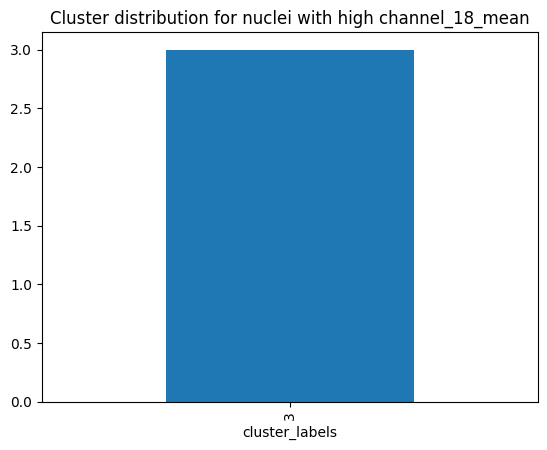


Cluster distribution for nuclei with high channel_19_mean:
cluster_labels
2     29
3      1
4      1
7    330
8      7
Name: count, dtype: int64


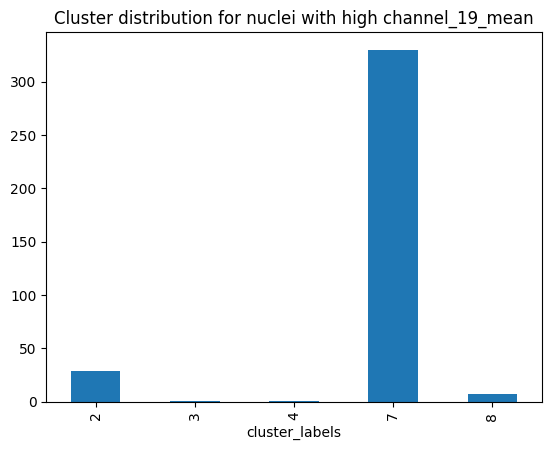


Cluster distribution for nuclei with high channel_20_mean:
cluster_labels
0     971
1    1580
2    1611
3     457
4     883
5     519
6     359
7     866
8     820
Name: count, dtype: int64


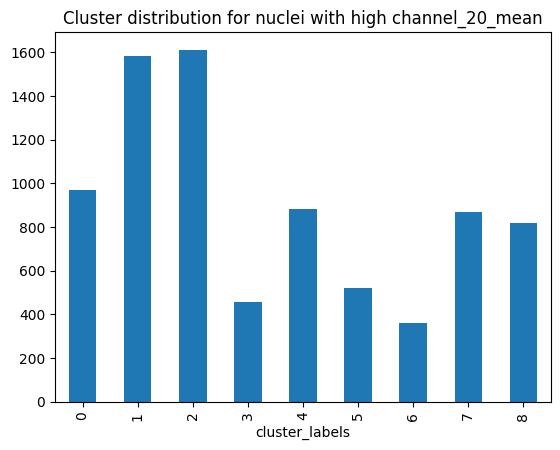


Cluster distribution for nuclei with high channel_21_mean:
cluster_labels
3    2
Name: count, dtype: int64


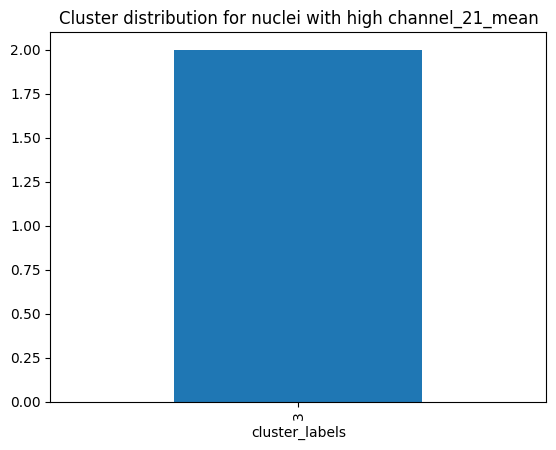


Cluster distribution for nuclei with high channel_22_mean:
cluster_labels
0      1
1      6
3    172
4    698
5      1
6     17
7      1
Name: count, dtype: int64


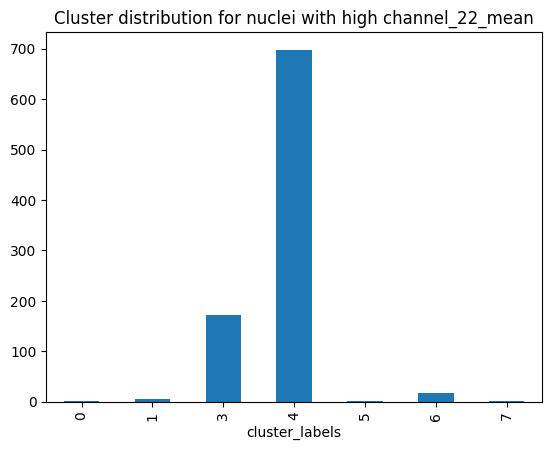


Cluster distribution for nuclei with high channel_23_mean:
cluster_labels
4    2
Name: count, dtype: int64


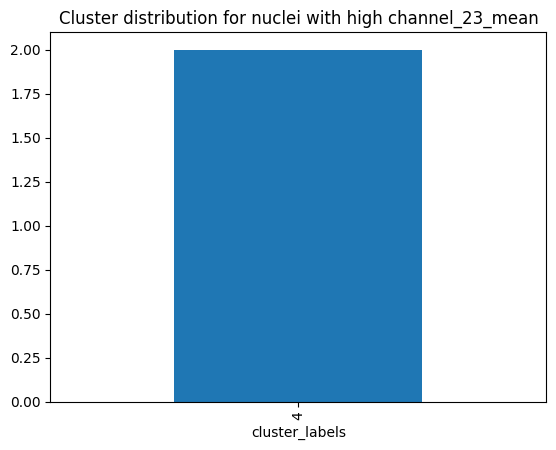


Cluster distribution for nuclei with high channel_24_mean:
cluster_labels
0     984
1    2118
2    2080
3     624
4    1261
5     778
6     450
7    1142
8    1006
Name: count, dtype: int64


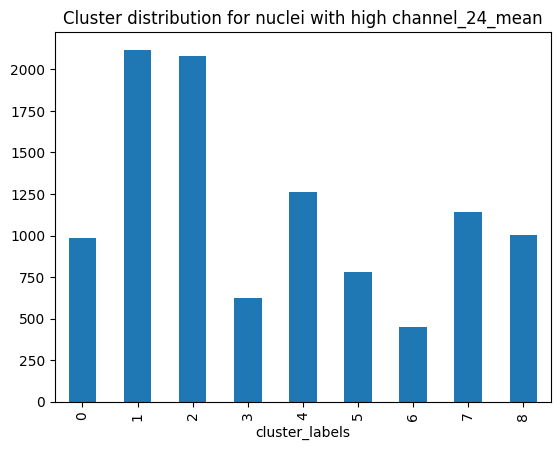


Cluster distribution for nuclei with high channel_25_mean:
cluster_labels
2     23
7      2
8    176
Name: count, dtype: int64


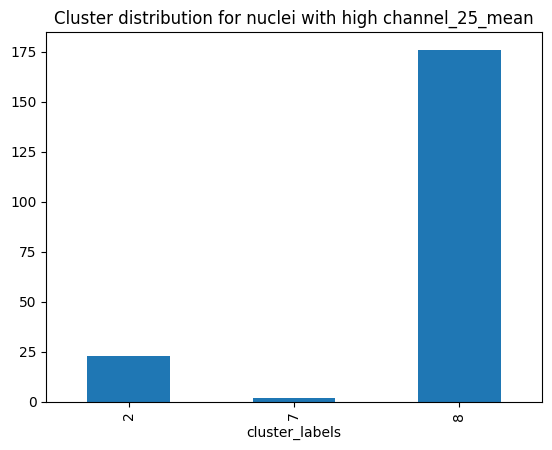


Cluster distribution for nuclei with high channel_26_mean:
cluster_labels
2    1
3    3
4    1
7    1
Name: count, dtype: int64


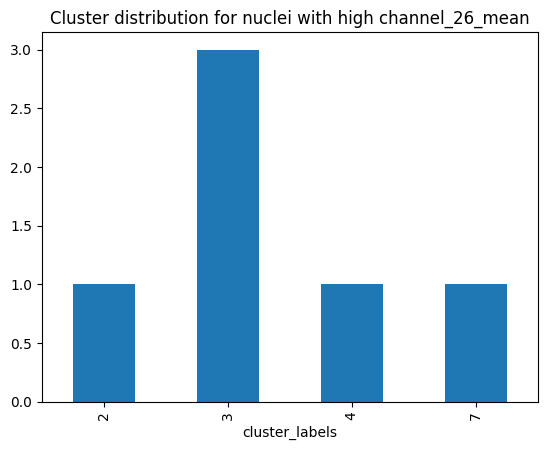


Cluster distribution for nuclei with high channel_27_mean:
cluster_labels
2    1
6    2
7    2
Name: count, dtype: int64


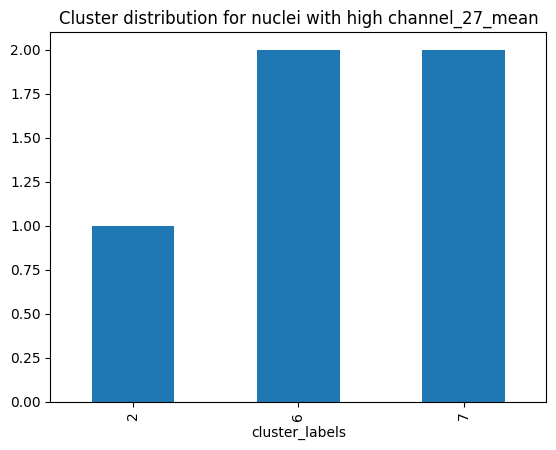


Cluster distribution for nuclei with high channel_28_mean:
cluster_labels
0    1246
1    3287
2    3208
3    1132
4    1979
5    1876
6     691
7    1628
8    1355
Name: count, dtype: int64


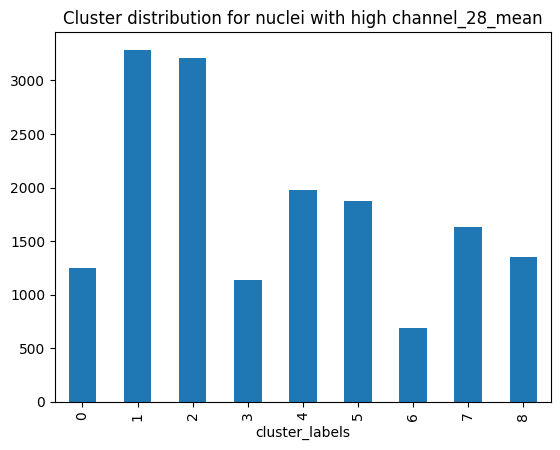


Cluster distribution for nuclei with high channel_29_mean:
cluster_labels
3    1
Name: count, dtype: int64


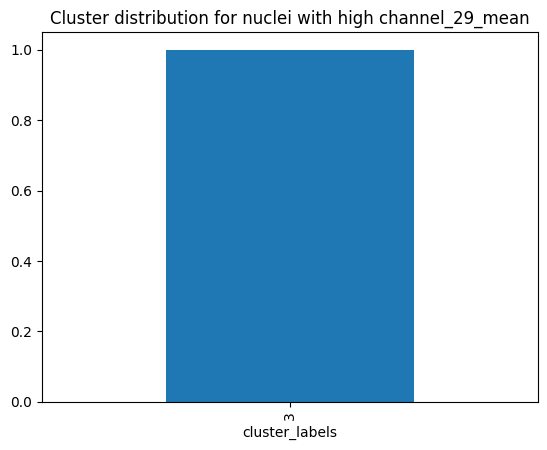


Cluster distribution for nuclei with high channel_30_mean:
cluster_labels
0     30
1    526
2      1
3      2
5     82
8      3
Name: count, dtype: int64


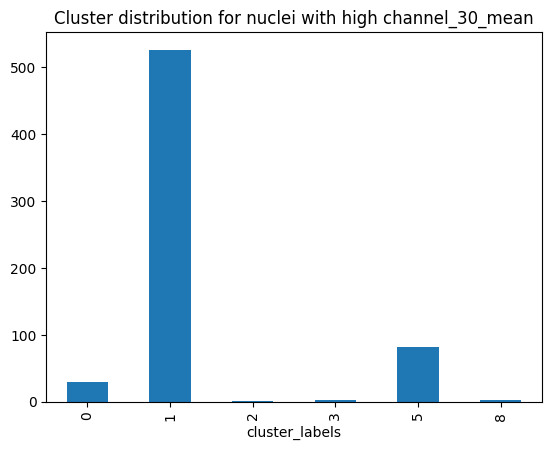


Cluster distribution for nuclei with high channel_31_mean:
cluster_labels
2    18
8     1
Name: count, dtype: int64


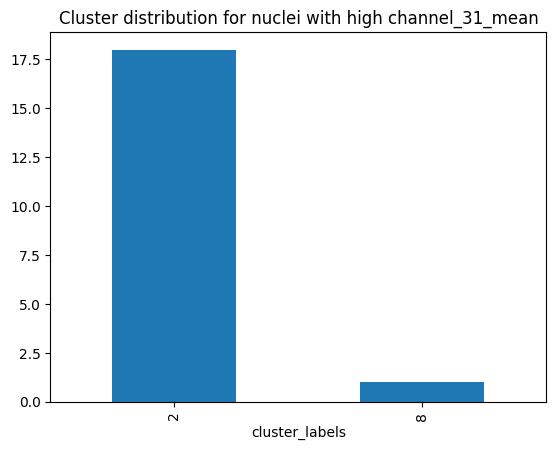


Cluster distribution for nuclei with high channel_32_mean:
cluster_labels
0    1225
1    3155
2    3111
3    1059
4    1908
5    1562
6     647
7    1574
8    1320
Name: count, dtype: int64


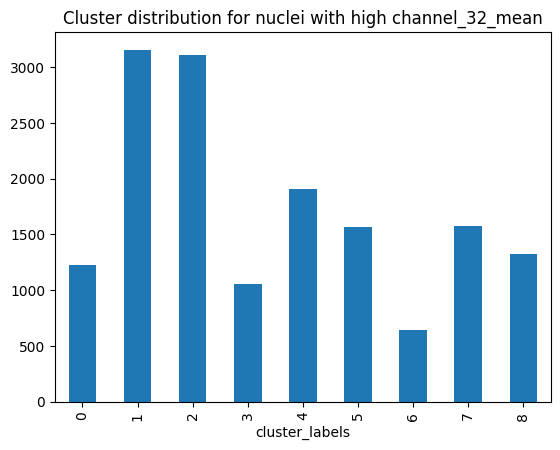


Cluster distribution for nuclei with high channel_33_mean:
cluster_labels
1    1
3    1
Name: count, dtype: int64


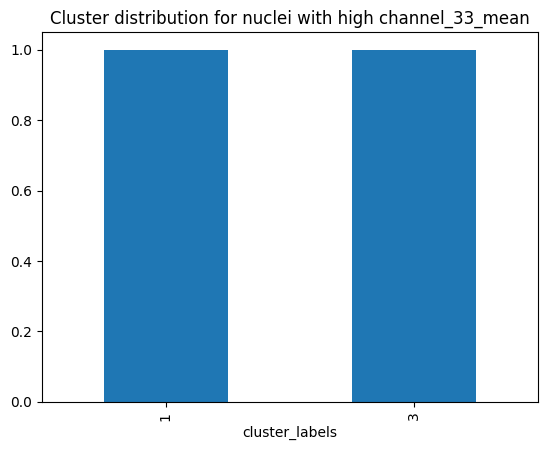


Cluster distribution for nuclei with high channel_34_mean:
cluster_labels
0     36
1     26
2     41
3     62
4     67
5      3
6    839
7     10
8      4
Name: count, dtype: int64


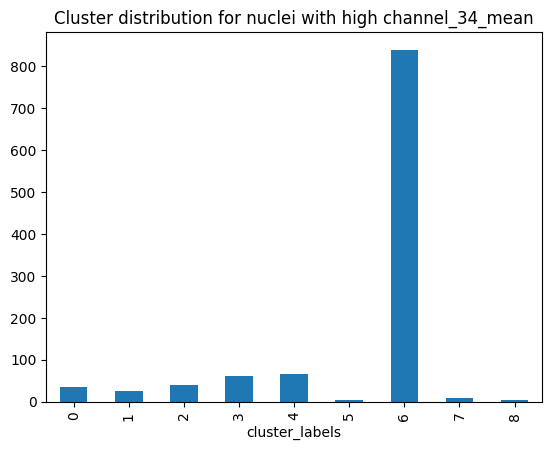


Cluster distribution for nuclei with high channel_35_mean:
cluster_labels
1    1
2    9
Name: count, dtype: int64


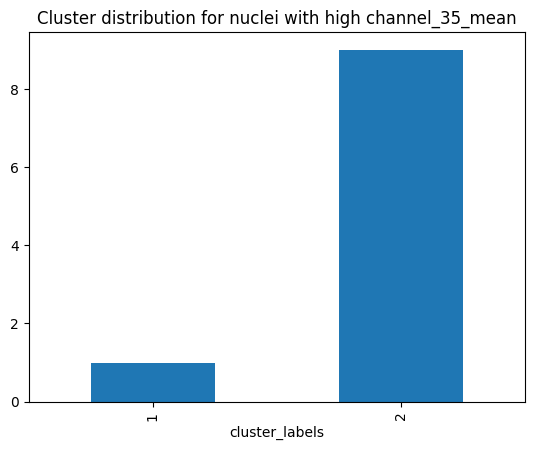


Cluster distribution for nuclei with high channel_36_mean:
cluster_labels
0    1248
1    3295
2    3211
3    1119
4    1981
5    1787
6     692
7    1603
8    1354
Name: count, dtype: int64


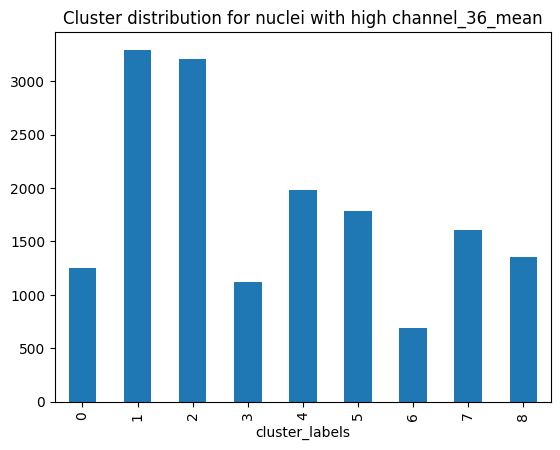


Cluster distribution for nuclei with high channel_37_mean:
cluster_labels
0     45
1    601
3    219
4    852
5    338
6      3
Name: count, dtype: int64


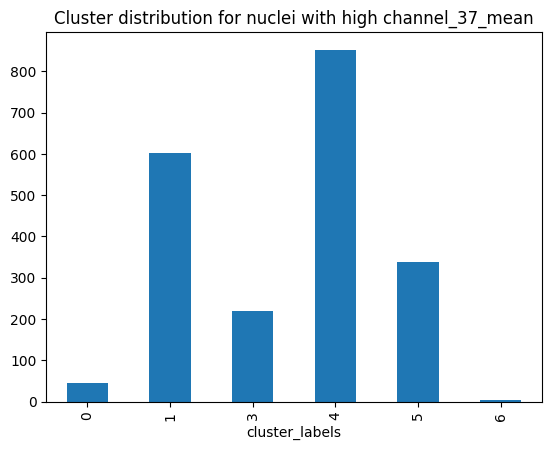


Cluster distribution for nuclei with high channel_38_mean:
cluster_labels
1      21
2    1775
3      21
4      80
5       3
6      53
7      13
8     150
Name: count, dtype: int64


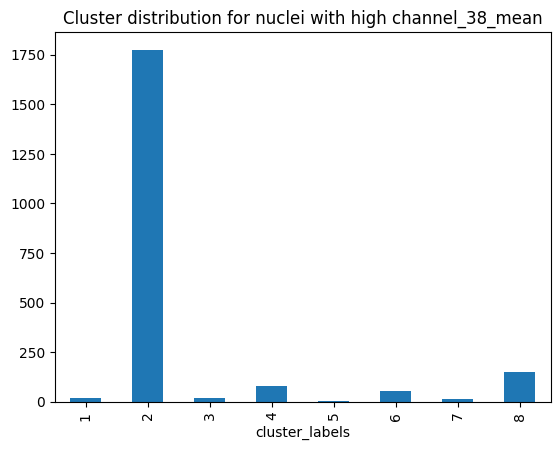


Cluster distribution for nuclei with high channel_39_mean:
cluster_labels
2    1
6    1
Name: count, dtype: int64


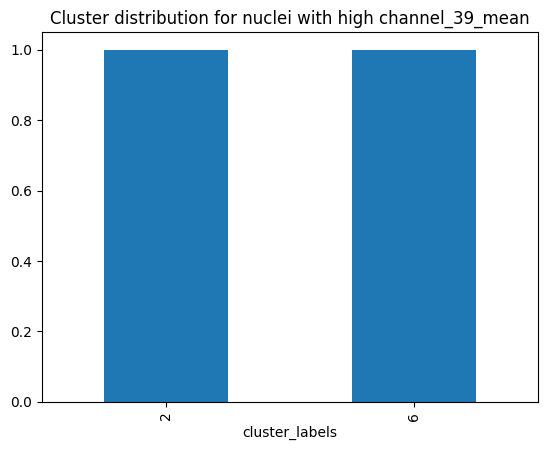


Cluster distribution for nuclei with high channel_40_mean:
cluster_labels
0    1168
1    3061
2    2982
3     998
4    1830
5    1478
6     616
7    1530
8    1299
Name: count, dtype: int64


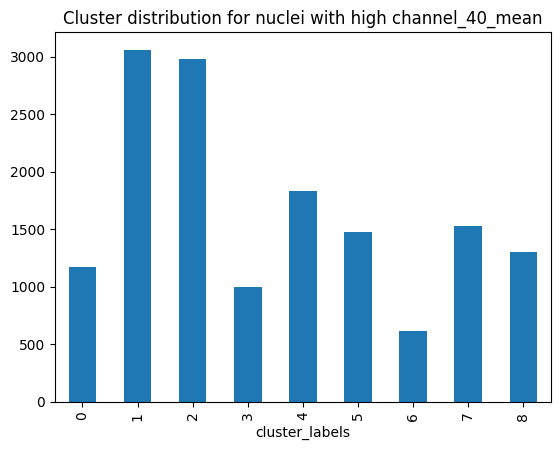


Cluster distribution for nuclei with high channel_41_mean:
cluster_labels
3    1
Name: count, dtype: int64


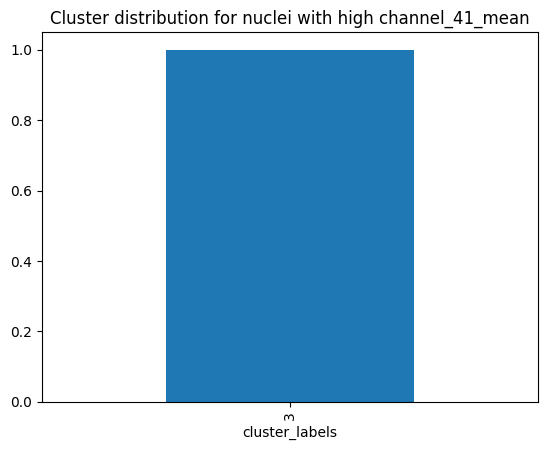


Cluster distribution for nuclei with high channel_42_mean:
cluster_labels
2     1
3    49
6     3
7     2
Name: count, dtype: int64


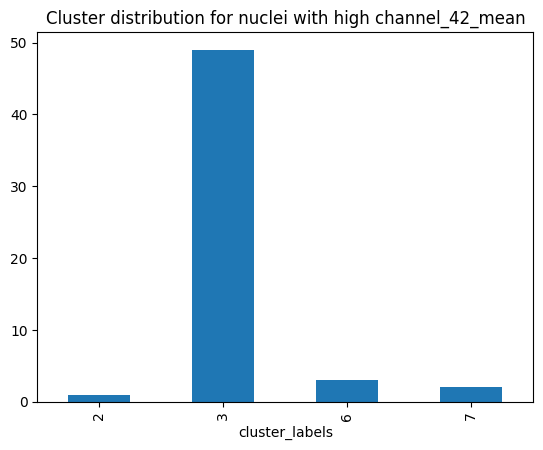


Cluster distribution for nuclei with high channel_43_mean:
cluster_labels
2    1
Name: count, dtype: int64


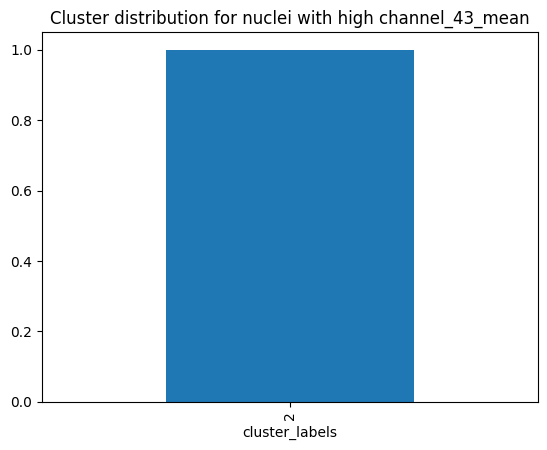

In [14]:
# Get list of all channels
channels = [col for col in features_df.columns if 'channel_' in col and '_mean' in col]

intensity_threshold = .7

for channel in channels:
    # Create a mask for nuclei over the intensity threshold in the current channel
    mask = features_df[channel] > intensity_threshold

    # Apply the mask to isolate the relevant nuclei
    filtered_df = features_df[mask]

    # Analyze the distribution of cluster labels within this group
    cluster_distribution = filtered_df['cluster_labels'].value_counts().sort_index()

    # Print or plot the distribution
    print(f"\nCluster distribution for nuclei with high {channel}:")
    print(cluster_distribution)
    
    if not cluster_distribution.empty:  # Check if the series is not empty
        cluster_distribution.plot(kind='bar', title=f'Cluster distribution for nuclei with high {channel}')
        plt.show()
    else:
        print(f"No nuclei exceeded the intensity threshold for {channel}")


In [2]:
import seaborn as sns

ModuleNotFoundError: No module named 'seaborn'

In [15]:
# Group by 'cluster_labels', calculate variance for each feature
cluster_variances = features_df.groupby('cluster_labels').var()


In [21]:
# Identify top 5 features with highest variance for each cluster
for cluster in cluster_variances.index:
    top_features = cluster_variances.loc[cluster].nlargest(5)
    print(f"Top 5 features driving intra-cluster differences in cluster {cluster} are {top_features.index.tolist()}")
    
    # Calculate proportion of total variance explained by these features
    total_variance = cluster_variances.loc[cluster].sum
    explained_variance = top_features.sum()
    print(f"These features explain {explained_variance / total_variance * 100:.2f}% of the total intra-cluster variance.")
    
    # Levene's test for these features across clusters
    from scipy.stats import levene
    for feature in top_features.index:
        stat, p = levene(*[features_df.loc[features_df['cluster_labels']==label, feature] for label in set(labels)])
        print(f"Levene Test for {feature} across clusters: W={stat}, p={p}")
    


Top 5 features driving intra-cluster differences in cluster 0 are ['channel_37_kurtosis', 'channel_37_max_intensity', 'channel_37_smoothness', 'channel_30_max_intensity', 'channel_30_smoothness']


TypeError: unsupported operand type(s) for /: 'float' and 'method'

In [26]:
import pandas as pd
from scipy.stats import levene

# Assuming cluster_variances and features_df are already defined
# Assuming 'labels' contains unique cluster labels

for cluster in cluster_variances.index:
    top_features = cluster_variances.loc[cluster].nlargest(626)
    print(f"Top 5 features driving intra-cluster differences in cluster {cluster} are {top_features.index.tolist()}")
    
    # Calculate proportion of total variance explained by these features
    total_variance = cluster_variances.loc[cluster].sum()
    explained_variance = top_features.sum()
    print(f"These features explain {explained_variance / total_variance * 100:.2f}% of the total intra-cluster variance.")
    
    # Calculate how much of the cluster variance each feature explains
    for feature in top_features.index:
        feature_variance = cluster_variances.loc[cluster, feature]
        print(f"Feature {feature} explains {feature_variance / total_variance * 100:.2f}% of the intra-cluster variance.")
    
    # Levene's test for these features across clusters
    for feature in top_features.index:
        stat, p = levene(*[features_df.loc[features_df['cluster_labels']==label, feature] for label in set(labels)])
        print(f"Levene Test for {feature} across clusters: W={stat}, p={p}")


Top 5 features driving intra-cluster differences in cluster 0 are ['channel_37_kurtosis', 'channel_37_max_intensity', 'channel_37_smoothness', 'channel_30_max_intensity', 'channel_30_smoothness', 'channel_19_kurtosis', 'orientation', 'channel_37_entropy', 'channel_40_min_intensity', 'channel_0_mean', 'channel_28_min_intensity', 'channel_37_skewness', 'channel_16_min_intensity', 'centroid_x', 'maxr', 'minr', 'channel_36_min_intensity', 'channel_37_std', 'channel_32_min_intensity', 'channel_8_min_intensity', 'channel_0_min_intensity', 'channel_6_kurtosis', 'channel_0_max_intensity', 'channel_20_mean', 'minc', 'maxc', 'centroid_y', 'channel_40_smoothness', 'channel_28_smoothness', 'channel_24_mean', 'channel_16_smoothness', 'channel_12_mean', 'channel_8_smoothness', 'channel_20_min_intensity', 'channel_36_smoothness', 'channel_8_mean', 'channel_30_std', 'channel_22_skewness', 'channel_31_skewness', 'channel_20_max_intensity', 'channel_20_smoothness', 'channel_4_mean', 'channel_12_min_inte

In [27]:
import pandas as pd
from scipy.stats import levene

# Sample data setup for demonstration
# cluster_variances = pd.DataFrame(...)  # Assuming this is predefined
# features_df = pd.DataFrame(...)  # Assuming this is predefined
# labels = features_df['cluster_labels'].unique()  # Assuming this retrieves unique cluster labels

for cluster in cluster_variances.index:
    # Selecting the top 5 features for simplicity; adjust number as needed
    top_features = cluster_variances.loc[cluster].nlargest(5)  # Adjusted to 5 for demonstration
    print(f"Top 5 features driving intra-cluster differences in cluster {cluster} are: {top_features.index.tolist()}")
    
    # Calculate proportion of total variance explained by these features
    total_variance = cluster_variances.loc[cluster].sum()
    explained_variance = top_features.sum()
    print(f"These features explain {explained_variance / total_variance * 100:.2f}% of the total intra-cluster variance.")
    
    # Calculate the proportion of cluster variance each feature explains
    for feature in top_features.index:
        feature_variance = cluster_variances.loc[cluster, feature]
        print(f"Feature {feature} explains {feature_variance / total_variance * 100:.2f}% of the intra-cluster variance.")
    
    # Levene's test for these top features across all clusters
    for feature in top_features.index:
        stat, p = levene(*[features_df.loc[features_df['cluster_labels'] == label, feature] for label in labels])
        print(f"Levene Test for {feature} across clusters: W={stat:.4f}, p={p:.4g}")  # Format for readability


Top 5 features driving intra-cluster differences in cluster 0 are: ['channel_37_kurtosis', 'channel_37_max_intensity', 'channel_37_smoothness', 'channel_30_max_intensity', 'channel_30_smoothness']
These features explain 11.38% of the total intra-cluster variance.
Feature channel_37_kurtosis explains 3.23% of the intra-cluster variance.
Feature channel_37_max_intensity explains 2.53% of the intra-cluster variance.
Feature channel_37_smoothness explains 2.44% of the intra-cluster variance.
Feature channel_30_max_intensity explains 1.62% of the intra-cluster variance.
Feature channel_30_smoothness explains 1.55% of the intra-cluster variance.
Levene Test for channel_37_kurtosis across clusters: W=867.7717, p=0
Levene Test for channel_37_max_intensity across clusters: W=656.1404, p=0
Levene Test for channel_37_smoothness across clusters: W=637.3664, p=0
Levene Test for channel_30_max_intensity across clusters: W=219.7265, p=0
Levene Test for channel_30_smoothness across clusters: W=221.217

In [24]:
# Save DataFrame to CSV
results_df.to_csv('results.csv', index=False)

In [25]:
pd.read_csv('results.csv')

,Cluster,Feature,Original p-value,Corrected p-value,Reject Null
0,0,channel_19_kurtosis,0.00000,0.000000,True
1,0,channel_6_kurtosis,0.00000,0.000000,True
2,0,channel_38_max_intensity,0.00000,0.000000,True
3,0,channel_37_mean,0.00000,0.000000,True
4,0,channel_38_smoothness,0.00000,0.000000,True
...,...,...,...,...,...
65,13,orientation,0.00001,0.000706,True
66,13,channel_37_mean,0.00000,0.000000,True
67,13,channel_37_smoothness,0.00000,0.000000,True
68,13,channel_30_smoothness,0.00000,0.000000,True


In [ ]:
# Create a new column in the dataframe to denote whether a data point is in cluster 5 or not
features_df['in_cluster_6'] = features_df['cluster_labels'] == 6

# Fit the ANOVA model
model = ols('channel_34_mean ~ C(in_cluster_6)', data=features_df).fit()

# Perform the ANOVA
anova_table = sm.stats.anova_lm(model, typ=2)

# Calculate η²
anova_table['eta_sq'] = anova_table[:-1]['sum_sq'] / sum(anova_table['sum_sq'])

print(anova_table)

In [23]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Create new columns in the dataframe to denote whether a data point is in cluster 2 or 10
features_df['in_cluster_2'] = features_df['cluster_labels'] == 2
features_df['in_cluster_10'] = features_df['cluster_labels'] == 10

# Fit the ANOVA model for cluster 2
model_2 = ols('channel_30_mean ~ C(in_cluster_2)', data=features_df).fit()
# Perform the ANOVA
anova_table_2 = sm.stats.anova_lm(model_2, typ=2)
# Calculate η² for cluster 2
anova_table_2['eta_sq'] = anova_table_2[:-1]['sum_sq'] / sum(anova_table_2['sum_sq'])

# Fit the ANOVA model for cluster 10
model_10 = ols('channel_30_mean ~ C(in_cluster_10)', data=features_df).fit()
# Perform the ANOVA
anova_table_10 = sm.stats.anova_lm(model_10, typ=2)
# Calculate η² for cluster 10
anova_table_10['eta_sq'] = anova_table_10[:-1]['sum_sq'] / sum(anova_table_10['sum_sq'])

print("ANOVA table for cluster 2:")
print(anova_table_2)
print("\nANOVA table for cluster 10:")
print(anova_table_10)


ANOVA table for cluster 2:
                     sum_sq       df            F  PR(>F)    eta_sq
C(in_cluster_2)  129.655720      1.0  4086.121829     0.0  0.154988
Residual         706.897702  22278.0          NaN     NaN       NaN

ANOVA table for cluster 10:
                      sum_sq       df            F  PR(>F)    eta_sq
C(in_cluster_10)   80.148514      1.0  2360.572469     0.0  0.095808
Residual          756.404908  22278.0          NaN     NaN       NaN


In [27]:
import seaborn as sns

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def analyze_intra_cluster_variability(df, cluster_label):
    # Filter DataFrame for the specific cluster
    cluster_df = df.loc[df['cluster_labels'] == cluster_label]

    # Compute and print descriptive statistics
    descriptive_stats = cluster_df.describe()
    print("Descriptive Statistics:")
    print(descriptive_stats)
    
    # Compute and print correlations
    correlations = cluster_df.corr()
    print("\nCorrelations:")
    print(correlations)

    # Create a pairplot
    sns.pairplot(cluster_df)
    plt.show()


In [ ]:
analyze_intra_cluster_variability(features_df, 3)

Descriptive Statistics:
       channel_0_mean  channel_0_std  channel_0_variance  channel_0_entropy  \
count     2133.000000    2133.000000         2133.000000        2133.000000   
mean         0.571442       0.426464            0.227796           0.617675   
std          0.209525       0.182061            0.153537           0.168275   
min          0.041101       0.011602            0.000828           0.003376   
25%          0.413648       0.296016            0.100234           0.503800   
50%          0.600337       0.443626            0.211738           0.651082   
75%          0.737567       0.566008            0.335228           0.747365   
max          0.972844       0.881377            0.783151           0.965357   

       channel_1_mean  channel_1_std  channel_1_variance  channel_1_entropy  \
count     2133.000000    2133.000000         2133.000000        2133.000000   
mean         0.000011       0.000052            0.000002           0.000184   
std          0.000227      

In [3]:
!pip install pandas


import pandas as pd

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 72.1 MB/s eta 0:00:0000:0100:01
  Using cached tzdata-2023.3-py2.py3-none-any.whl (341 kB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
antspyx 0.3.8 requires scipy, which is not installed.
statsmodels 0.14.0 requires scipy!=1.9.2,>=1.4, which is not installed.
